# 2020.06.10_refactored_rnns
-----
refactored the rnns to support single step updates. Will test these


### Version Info
* madmax: `76580a6`
* research: `e3ba70d`



---
## History

#### 2020.06.08_baselines_again
Since I am a total fucking retard and I delete all important shit - I'm going to waste anotehr day regenerating this fucking shit

Recap of all models to date
*   basic online model with rolling window (no technical features)
*  disjoint returns
*   online learning with Q and P-omega weights
* boosting / sequential residualization


#### 2020.06.04_recap
Recap of all models to date
*   basic online model with rolling window (no technical features)
*  disjoint returns
*   online learning with Q and P-omega weights
* boosting / sequential residualization



In [19]:
mx.online.PolynomialFeatures.forward

<function madmax.algos.online.transformers.PolynomialFeatures.__call__(self, X_t, W_t='not_used')>

In [17]:
# preamble
%alias_magic  nbagg matplotlib -p nbagg
%alias_magic  inline matplotlib -p inline
%load_ext memory_profiler
%load_ext line_profiler

from pylab import *
from madmax.api import *
mx = mx.reload()
mxtr = mxtr.reload()
plt.style.use('seaborn-whitegrid')

###################################################################
# Interactive configuration
# When running a config grid this will throw a FrozenException
# and the grid Config will be used
###################################################################
try:
    Config = mx.Configuration(
        name = 'etf_technical/2020.06.10_refactored_rnns/',
        mode = 'interactive',
        hps = mx.HPSet(
            start='20070101',
            end='20200501',
            INTS_PER_DAY = 13,                
        ),
        code = '2020.06.10_sequential_boosting.ipynb',
        tb_port=6007,
    )
    disp('Running interactive configuration ', h=2)
except mx.Configuration.FrozenException:
    if Config.mode != 'grid':
        raise RuntimeError('An unexpected configruation encountered')
    disp('Running a grid configuration ', h=2)

device = 'cuda'
dtype = tr.float32
Config.start()


# to run run a grid of hyperparameters ...
####################################
# # hyperparameters
# mx.Config.hps = fr.HPSet(
# )
# mx.Config.code = ''
# # configs = []
# # for obs_weight in ['no_weight', 'dollar_weight', 'log_weight']:
# #     cfg = fr.Config.clone()
# #     cf
# #     cfg.hps = cfg.hps.clone( obs_weight=obs_weight )
# #     cfg.freeze()
# #     display_html( cfg )
# #     configs.append( cfg )
# # notebook = fr.Config.run_grid( configs, outfile=fr.Config.uri+'/../cadre_price_index.20200302 - weight_grid_results.ipynb', n_jobs=None )

Created `%nbagg` as an alias for `%matplotlib nbagg`.
Created `%inline` as an alias for `%matplotlib inline`.


<IPython.core.display.Javascript object>

<h1> Config etf_technical/2020.06.10_refactored_rnns/ </h1>
<b> hash</b>: none </h4>
<b> mode </b>: interactive
<b> frozen </b>: False
<b> uri </b>: /home/fj/experiments/etf_technical/2020.06.10_refactored_rnns/none
<b> tb_port </b>: 6007
<h3> Hyperparameters </h3>
HPSet(
		INTS_PER_DAY=13,
		end='20200501',
		start='20070101',
	)<h3> Code </h3>
<b> format </b>: .ipynb
<b> code </b> : /local/cloud/code/research/etf_technical/2020.06.10_sequential_boosting.ipynb

## interactive global hyperparameters

In [6]:
# global  configruation
#######
if Config.mode == 'grid':
    raise Config.FrozenException( 'running grid configruation - skipping')

hps = Config.hps

hps.universe = mx.HPSet(
    start = '20100101',
    end='20200401',
    min_count=2000,
    min_dollar_vol=1e5
)


hps.feature_set = mx.HPSet(
    unadj_prices=[
        'open_unadj_30min', 'high_unadj_30min', 'low_unadj_30min', 'close_unadj_30min', 'mid_unadj_30min',
        'log_open_unadj_30min', 'log_close_unadj_30min',
    ],
    adj_prices=[
        'open_adj_30min', 'high_adj_30min', 'low_adj_30min', 'close_adj_30min',
        'mid_adj_30min', 'mid_adj_0D.12h.vwap', 'mid_adj_2D.12h.vwap', 'mid_adj_5D.vwap',
        'open_adj_0D.12h', 'high_adj_0D.12h', 'low_adj_0D.12h',
        'open_adj_2D.12h', 'high_adj_2D.12h', 'low_adj_2D.12h',
        'open_adj_5D', 'high_adj_5D', 'low_adj_5D',
    ],
    rel_prices=[
        'rel_price_260', 'rel_price_780', 'rel_price_3276',
    ],
    volumes=[
        'volume_unadj_30min', 'dollar_volume_unadj_30min', 'avg_dollar_volume',
    ],
    log_volumes=[
        'log10_dollar_volume_30min', 'log10_dollar_volume_30min_resid',
    ],
    rel_volume=[
        'rel_dollar_volume_260', 'rel_dollar_volume_780',
        'rel_dollar_volume_3276',
    ],
    calendar=[
        'timeofday', 'cos1_timeofday', 'cos2_timeofday', 'cos4_timeofday',
        'dayofweek', 'cos1_dayofweek', 'cos2_dayofweek',
        'weekofmonth', 'cos1_weekofmonth', 'cos2_weekofmonth',
        'monthofquarter', 'cos1_monthofquarter', 'cos2_monthofquarter',
        'quarterofyear', 'cos1_quarterofyear', 'cos2_quarterofyear',
    ],
    lagging=[
        'lagrtn_adj_30min', 'lagrtn_adj_1hr', 'lagrtn_adj_1day',
        'lagrtn_adj_30min_resid',
    ],
    mkt=[
        'mkt_lagrtn_30min',
        'mkt_lagrtn_30min_260.rw_sd', 'mkt_lagrtn_30min_780.rw_sd', 'mkt_lagrtn_30min_3276.rw_sd',
    ],
    vol=[
        'lagrtn_adj_30min_260.rw_sd', 'lagrtn_adj_30min_780.rw_sd', 'lagrtn_adj_30min_3276.rw_sd',
        'lagrtn_adj_30min_resid_260.rw_sd', 'lagrtn_adj_30min_resid_780.rw_sd', 'lagrtn_adj_30min_resid_3276.rw_sd',
    ],
    zscores=[
        'lagrtn_adj_30min_260.rw_zscore', 'lagrtn_adj_30min_780.rw_zscore', 'lagrtn_adj_30min_3276.rw_zscore',
        'lagrtn_adj_30min_resid_260.rw_zscore', 'lagrtn_adj_30min_resid_780.rw_zscore',
        'lagrtn_adj_30min_resid_3276.rw_zscore',
    ],
    betas=[
        'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min_2340.ew_beta',
        'lagrtn_adj_30min_3276.ew_beta', 'lagrtn_adj_30min_6500.ew_beta',
    ],
    afacs=[ 'bw_afac_30min', 'fw_afac_30min' ],
    technical=[
        'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
        'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
        'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
        'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
        'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
    ],    
)

hps.leading_rtns = [
    'leadrtn_adj_30min', 'leadrtn_adj_1hr', 'leadrtn_adj_1day',
    'mkt_leadrtn_30min', 'mkt_leadrtn_1day',
    'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2', 'leadrtn_adj_30min_disjoint.3',
]

hps.weights = ['valid_30min', 'weight', ]
    
baselines = OrderedDict()

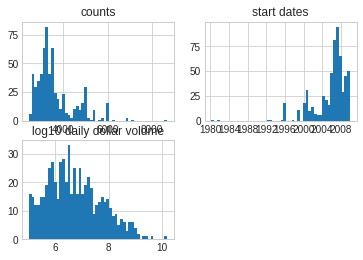

In [7]:
# identify the universe of ETFS
#############################################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )

etf_stats = etfd.compute_etf_stats()
etf_stats = etf_stats[etf_stats.vendor=='kibot']
orig_len = len( etf_stats )
# drop etfs without enough history
etf_stats = etf_stats[(etf_stats['start'] <= hps.universe.start ) 
                      & (etf_stats['end'] > hps.universe.end ) 
                      & (etf_stats['n'] >= hps.universe.min_count)
                      & (etf_stats['daily_dollar_volume_adj'] >= hps.universe.min_dollar_vol ) ]

disp( 'after filtering', len( etf_stats ), 'symbols out of original ' ,orig_len )

etf_stats = (etf_stats
             .merge( etfd.all_etfs, how='left', left_on='symbol', right_on='Symbol' )
             .drop( columns=['Symbol', 'ETP Name', 'Leveraged / Inverse' ])
             .rename( columns={'Asset Class':'asset_class', 'Description':'name'} )
             .fillna( 'Not Specified')             
             .set_index('symbol')
            )
disp( etf_stats.groupby('asset_class').name.count() )

ax = subplot( 2,2, 1 )
etf_stats.n.hist(ax=ax, bins=50)
ax.set_title( 'counts')

ax = subplot( 2,2, 2 )
etf_stats.start.hist(ax=ax, bins=50)
ax.set_title( 'start dates')

ax = subplot( 2,2, 3 )
etf_stats.daily_dollar_volume_adj.log10().hist(ax=ax, bins=50)
ax.set_title( 'log10 daily dollar volume')

# this is the universe we will work with. 
# HERO has a massive returns spike in 2015.11.09 - which throws off residualization quite a bit.
hps.universe.symbols = sorted( etf_stats.index.values )


In [8]:
# build up the data and features
#############################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )
from research.etf_technical import etf_technical_20200517 as etfrc; reload( etfrc )

# fetch the data as a dataarray
builder = etfd.BuildDataWithAfacs( symbols=hps.universe.symbols, mkt_only=True, start=hps.start ,).set( memoize=True )
builder.data = None
disp( 'builder BuildDataWithAfacs_7f79ef4bf  expected got', builder.hash() )
da = builder(  )
df = builder.output_meta

# hyperparams related to computing returns and residuals
hps.returns_hps = mx.HPSet(    
    price_windows=[ 24*1, 24*5, 24*10],
    beta_halflifes=[13 * 90, 13 * 180, 13 * 252, 13*500],
    dollar_volume_window=13*180,
    ema_halflifes=[20 * 13, 60 * 13, 252 * 13],
    resid_halflife=13,
    
)
# compute log-returns, log-dollar-volume, betas, residual returns and clean up the data
rtn_computer = etfrc.compute_returns_and_betas( 
    start=hps.start, end=None,     
    dollar_volume_window=hps.returns_hps.dollar_volume_window, 
    price_windows = hps.returns_hps.price_windows,
    beta_halflifes=hps.returns_hps.beta_halflifes, 
    resid_halflife=None,    
) 
rtn_computer.data = builder
disp( 'expected compute_returns_and_betas_9280a30dd got', rtn_computer.hash(), h=4, color='teal' )

# add relative price and relative volume features
rel_price_and_vols = etfrc.add_relative_price_and_volumes( emas=hps.returns_hps.ema_halflifes )
rel_price_and_vols.data = rtn_computer
disp( 'expected add_relative_price_and_volumes_a65da371a got', rel_price_and_vols.hash(), h=4, color='teal' )

# add volatility and calendar features
add_vols = etfrc.add_volatilities( emas=hps.returns_hps.ema_halflifes )
add_vols.data = rel_price_and_vols
disp( 'expected add_volatilities_77ca914f0 got', add_vols.hash(), h=4, color='teal' )

# add disjoint returns
disjoint_returns= etfrc.add_dijoint_returns( lags=(1, 2, 3) )
disjoint_returns.data = add_vols
disjoint_returns.features = 'leadrtn_adj_30min'
disp( 'expected add_dijoint_returns_ed1f196d1 got', disjoint_returns.hash(), h=4, color='teal' )
da = disjoint_returns(   )

# Retest the baselines

# OnlineRunner_01ede913b

## Most basic baseline no omega weights, quadratic emas (on top of OnlineRunner_9fcf514b3)

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,15515728,0.887167,-0.731618,0.608023,0.010110,0.000102,36.928314,2.170442,0.563672,0.531332,0.472149
leadrtn_adj_30min_disjoint.1,NaN,15515728,0.887131,-0.731618,0.009175,-0.003852,0.000015,-13.307078,-0.947372,0.563672,0.531332,0.472149
leadrtn_adj_30min_disjoint.2,NaN,15515728,0.887096,-0.731618,0.092533,0.012131,0.000147,43.637241,2.739650,0.563672,0.531332,0.472149


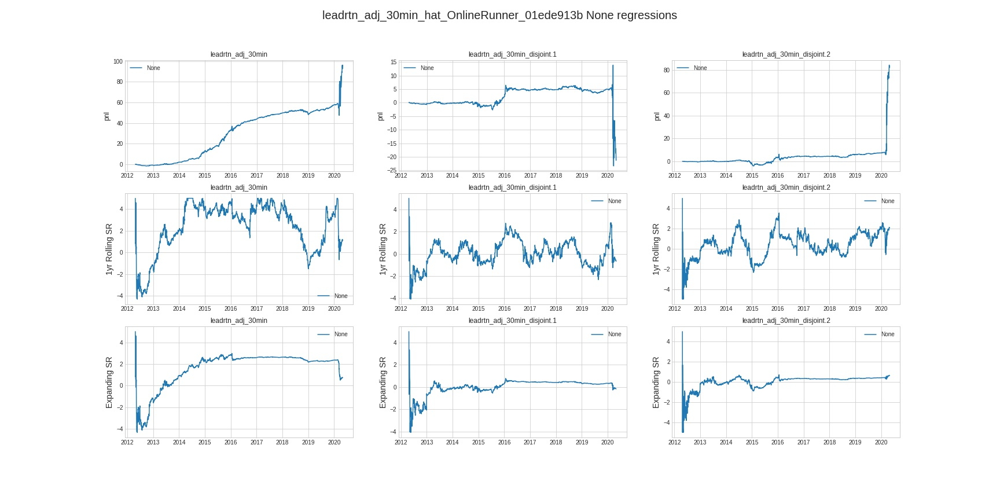

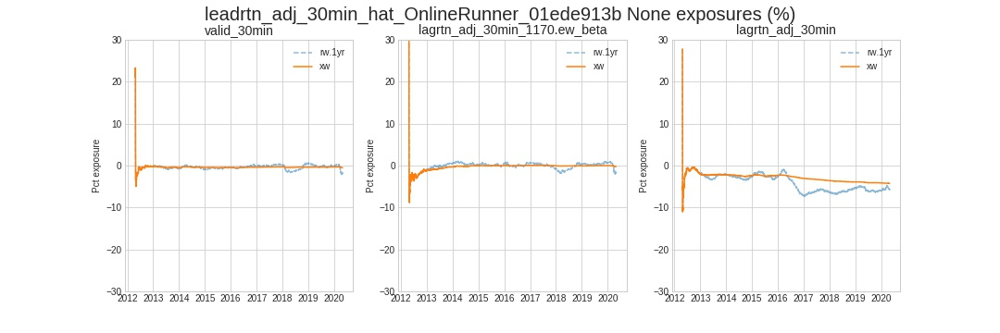

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,15515728,0.887167,-1.862212e-10,0.869837,0.007135,5.090237e-05,25.461100,6.031275,0.740985,0.709024,0.694828
leadrtn_adj_30min_disjoint.1,NaN,15515728,0.887131,-1.862212e-10,0.087032,0.000691,4.768372e-07,2.662174,0.986687,0.740985,0.709024,0.694828
leadrtn_adj_30min_disjoint.2,NaN,15515728,0.887096,-1.862212e-10,0.135454,0.002549,6.496906e-06,8.375827,2.606882,0.740985,0.709024,0.694828


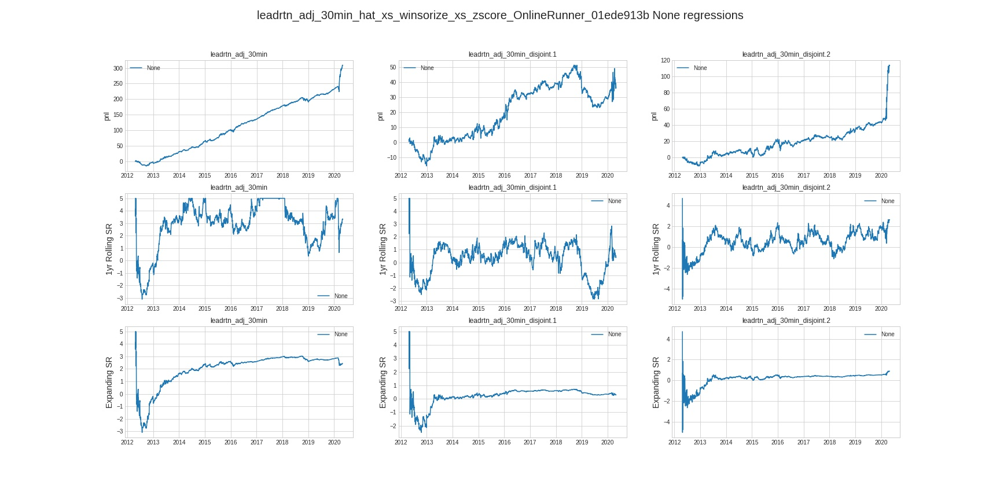

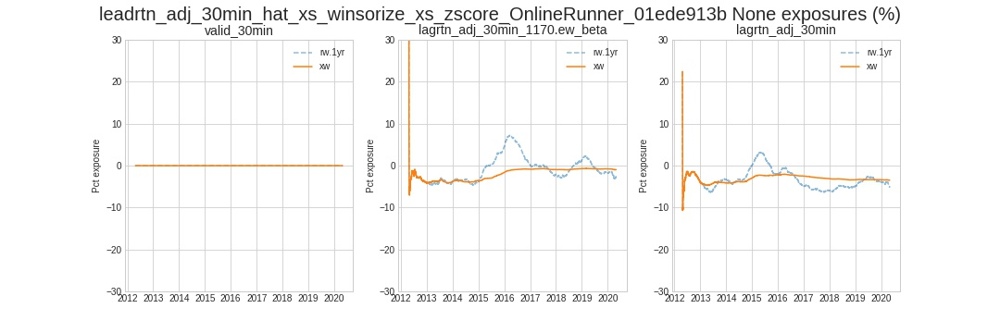

/home/fj/anaconda3/lib/python3.7/site-packages/scipy/io/netcdf.py:317: RuntimeWarning: Cannot close a netcdf_file opened with mmap=True, when netcdf_variables or arrays referring to its data still exist. All data arrays obtained from such files refer directly to data on disk, and must be copied before the file can be cleanly closed. (See netcdf_file docstring for more information on mmap.)
  ), category=RuntimeWarning)


,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3,fcst_1
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b,fcst_2


,fcst_0,fcst_1,fcst_2
fcst_0,1.000000,0.310211,0.277623
fcst_1,0.310211,1.000000,0.580919
fcst_2,0.277623,0.580919,1.000000


,x,fcst_0,fcst_1,fcst_2
y,tgt,,,
fcst_0,leadrtn_adj_30min,2.226007,1.194296,1.600546
fcst_1,leadrtn_adj_30min,2.950834,3.148811,2.205308
fcst_2,leadrtn_adj_30min,2.250643,1.048102,2.436147


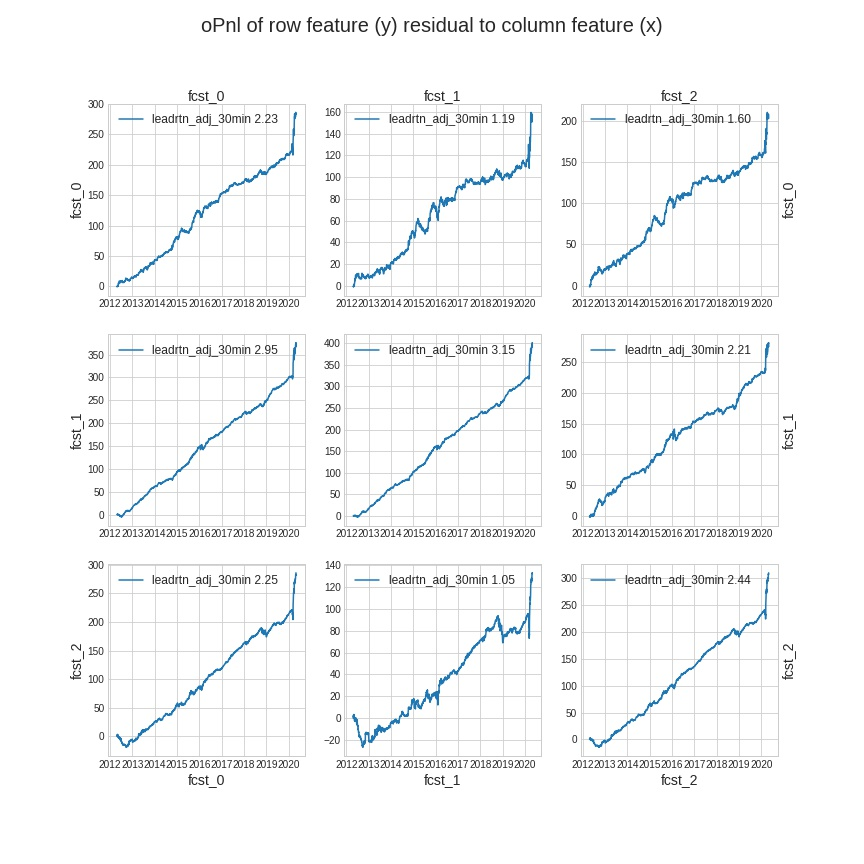

In [13]:
# OnlineRunner_01ede913b
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_01ede913b'
BASELINE_NOTES = 'Most basic baseline no omega weights, quadratic emas (on top of OnlineRunner_9fcf514b3)'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_9fcf514b3' )

baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        winsorize_target=False, #winsorize returns
        winsorize_features=0.01, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # util penalty
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=2,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega=None,
        omega_lr=1e-5,
        omega_ridge=0,
        omega_shift=0.1,    
        # the transformer
        transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = baselined_forecasts[-2:] + [baseline.output_features[-1]]
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Forecast auto-correlations', results['static_autocorrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Forecast auto-correlations', results['roll_autocorrs'], h=2 )
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )   

# OnlineRunner_425d07849

## P omega weights boosted on top of OnlineRunner_01ede913b

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,15219728,0.887681,-1.256614,0.518584,0.004632,0.000021,16.708668,1.018857,0.664244,0.647679,0.590932
leadrtn_adj_30min_disjoint.1,NaN,15219728,0.887644,-1.256614,-0.046864,-0.004658,0.000022,-15.746215,-1.141017,0.664244,0.647679,0.590932
leadrtn_adj_30min_disjoint.2,NaN,15219728,0.887609,-1.256614,-0.039692,0.007353,0.000054,25.952587,1.965272,0.664244,0.647679,0.590932


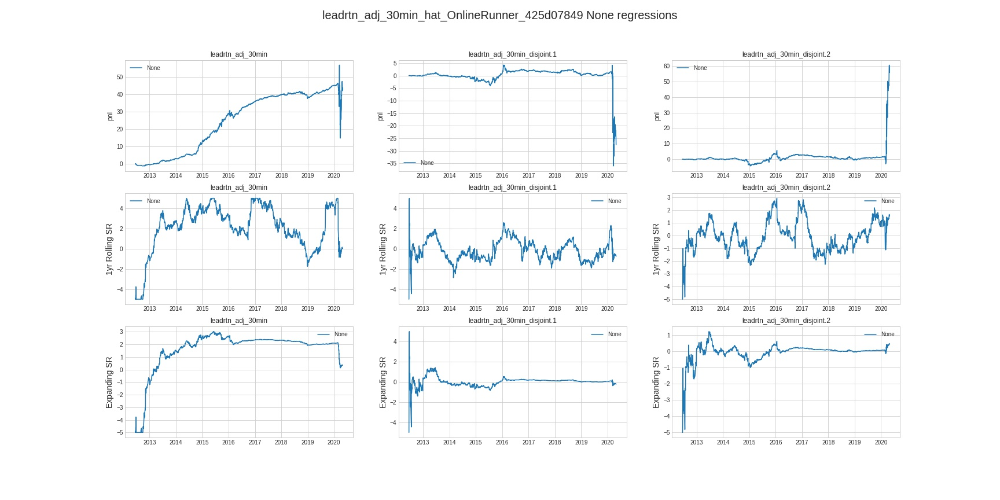

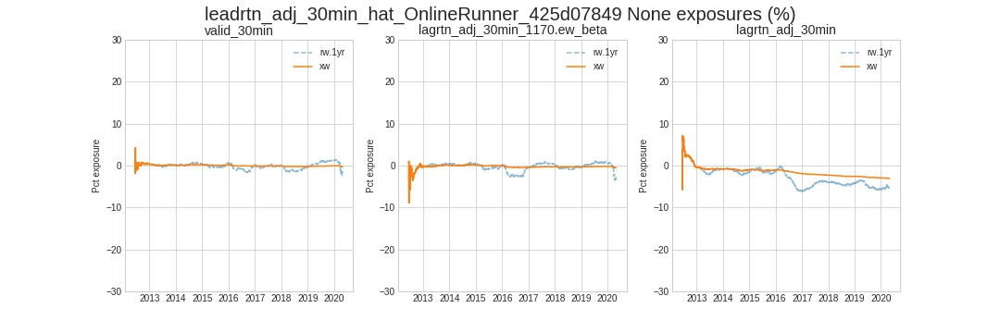

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,15219728,0.887681,-1.433583e-10,0.799297,0.005185,2.688169e-05,18.431557,6.008670,0.810291,0.79713,0.787272
leadrtn_adj_30min_disjoint.1,NaN,15219728,0.887644,-1.433583e-10,-0.077446,-0.000000,0.000000e+00,-0.288432,-0.129133,0.810291,0.79713,0.787272
leadrtn_adj_30min_disjoint.2,NaN,15219728,0.887609,-1.433583e-10,-0.097964,0.000691,-4.768372e-07,1.014837,0.460005,0.810291,0.79713,0.787272


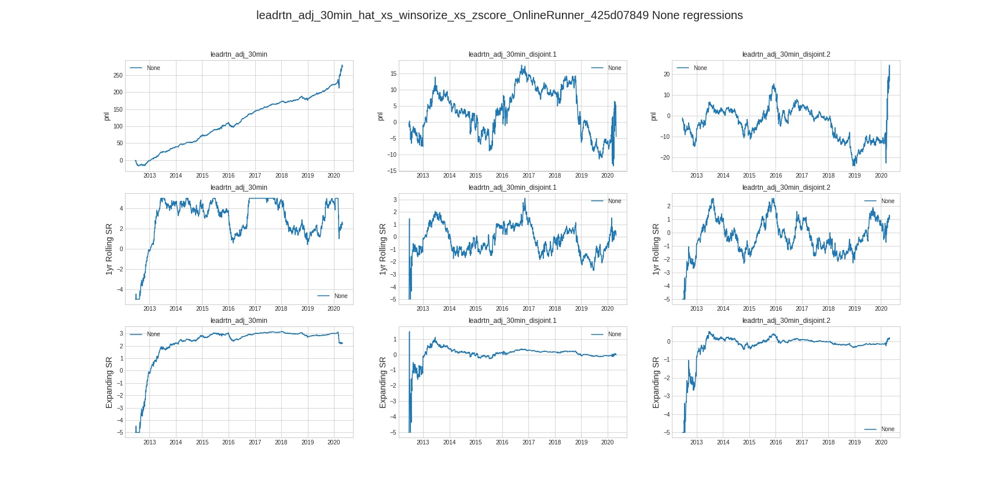

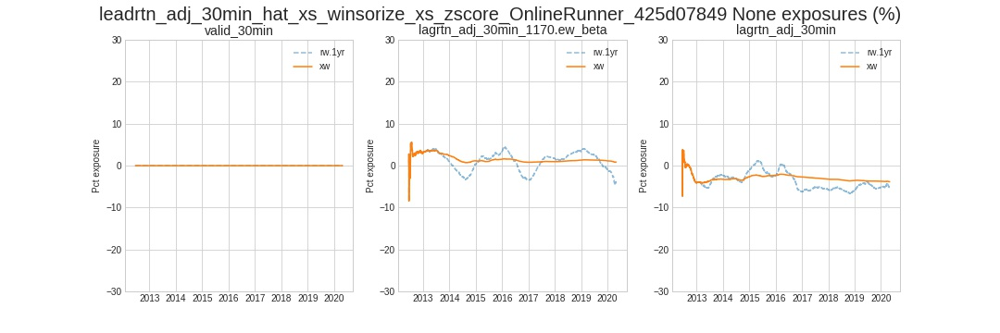

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b,fcst_1
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_425d07849,fcst_2


,fcst_0,fcst_1,fcst_2
fcst_0,1.000000,0.585423,0.122312
fcst_1,0.585424,1.000000,0.044491
fcst_2,0.122312,0.044491,1.000000


,x,fcst_0,fcst_1,fcst_2
y,tgt,,,
fcst_0,leadrtn_adj_30min,3.184738,2.198294,3.101145
fcst_1,leadrtn_adj_30min,1.095052,2.510953,2.488976
fcst_2,leadrtn_adj_30min,1.869682,2.129792,2.193690


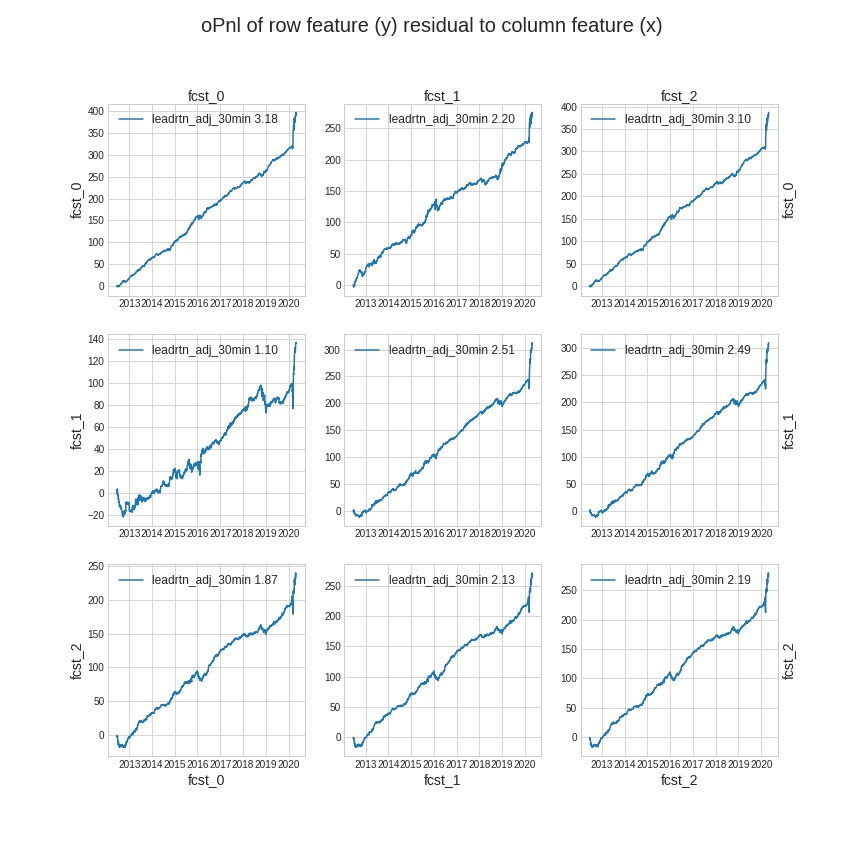

In [18]:
# OnlineRunner_425d07849
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_425d07849'
BASELINE_NOTES = 'P omega weights boosted on top of OnlineRunner_01ede913b'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_01ede913b' )
baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
        +['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',]
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        winsorize_target=False, #winsorize returns
        winsorize_features=0.01, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # util penalty
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=2,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
            + ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',]
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega='P',
        omega_lr=1e-2,
        omega_ridge=0.1,
        omega_shift=0.1,    
        # the transformer
        transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = baselined_forecasts[-2:] + [baseline.output_features[-1]]
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Forecast auto-correlations', results['static_autocorrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Forecast auto-correlations', result['roll_autocorrs'], h=2 )
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )   

# OnlineRunner_90531f28c

## A basic baseline (no omega weights + quadratic + emas) but replacing feature_wins by online clip (residualized for  OnlineRunner_01ede913b)

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,15219728,0.887681,-0.868777,0.668099,0.003294,0.000011,11.753173,1.888059,0.749931,0.736569,0.71473
leadrtn_adj_30min_disjoint.1,NaN,15219728,0.887644,-0.868777,0.062596,-0.002561,0.000007,-7.791345,-1.206149,0.749931,0.736569,0.71473
leadrtn_adj_30min_disjoint.2,NaN,15219728,0.887609,-0.868777,-0.059694,0.003530,0.000012,11.994085,1.270729,0.749931,0.736569,0.71473


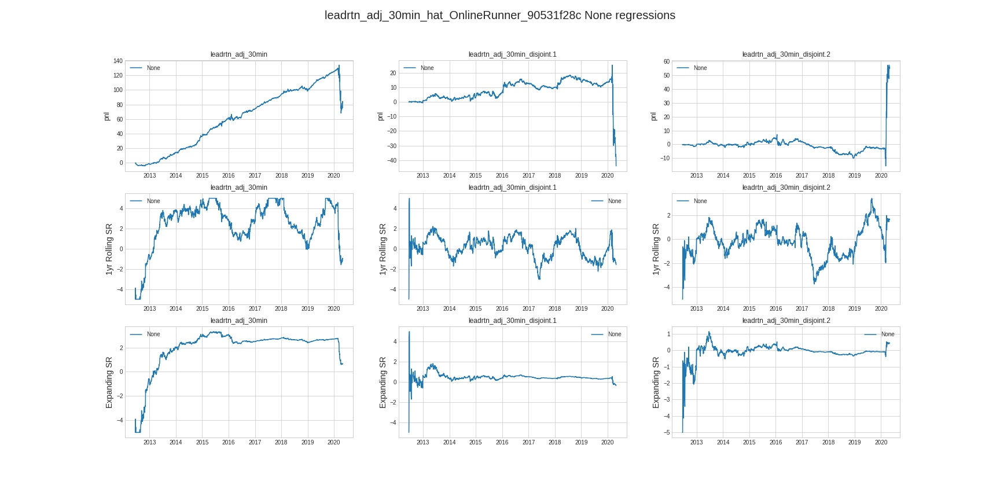

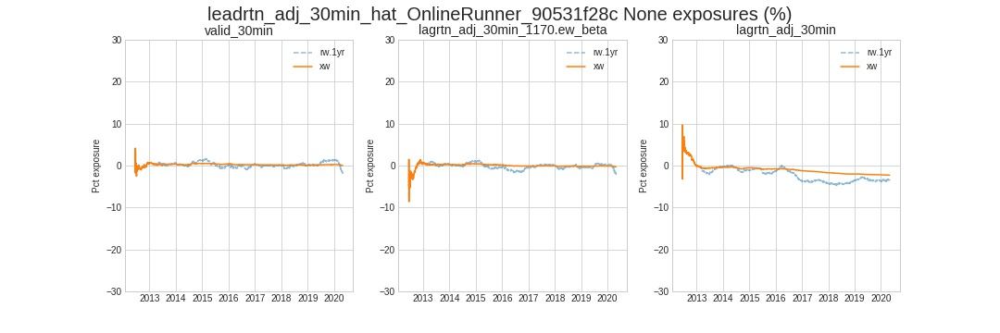

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,15219728,0.887681,1.693336e-10,1.027475,0.005039,2.539158e-05,17.632952,8.192685,0.785331,0.767907,0.75603
leadrtn_adj_30min_disjoint.1,NaN,15219728,0.887644,1.693336e-10,0.045545,0.000598,-3.576279e-07,0.787126,0.434238,0.785331,0.767907,0.75603
leadrtn_adj_30min_disjoint.2,NaN,15219728,0.887609,1.693336e-10,-0.106445,0.000488,-2.384186e-07,0.132259,0.063284,0.785331,0.767907,0.75603


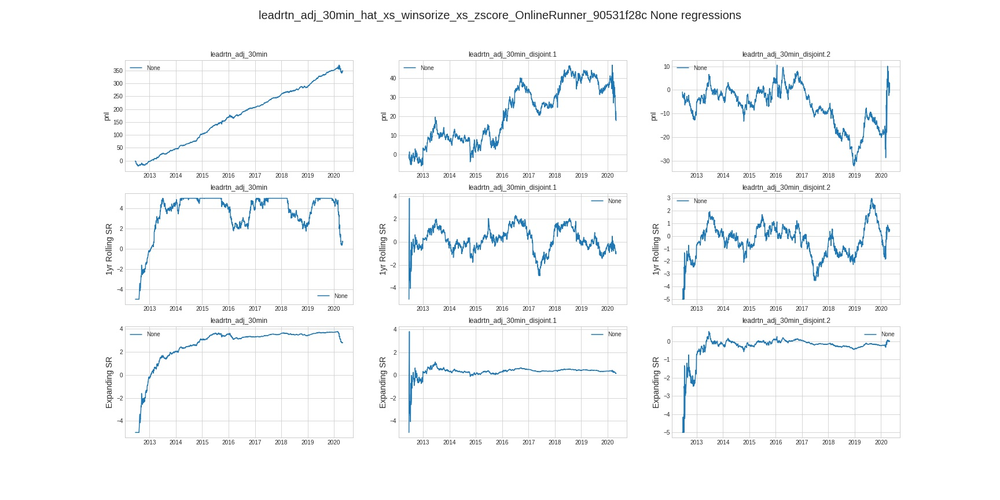

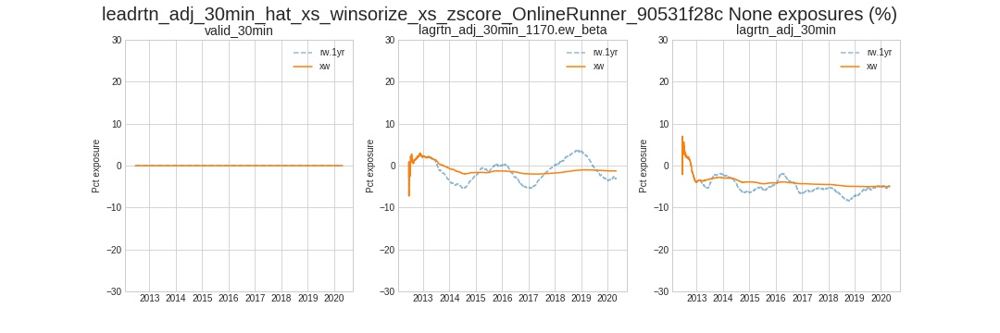

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b,fcst_1
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c,fcst_2


,fcst_0,fcst_1,fcst_2
fcst_0,1.000000,0.585423,0.172309
fcst_1,0.585424,1.000000,0.026750
fcst_2,0.172309,0.026750,1.000000


,x,fcst_0,fcst_1,fcst_2
y,tgt,,,
fcst_0,leadrtn_adj_30min,3.184738,2.198294,2.873076
fcst_1,leadrtn_adj_30min,1.095052,2.510953,2.467779
fcst_2,leadrtn_adj_30min,1.947452,2.688396,2.793015


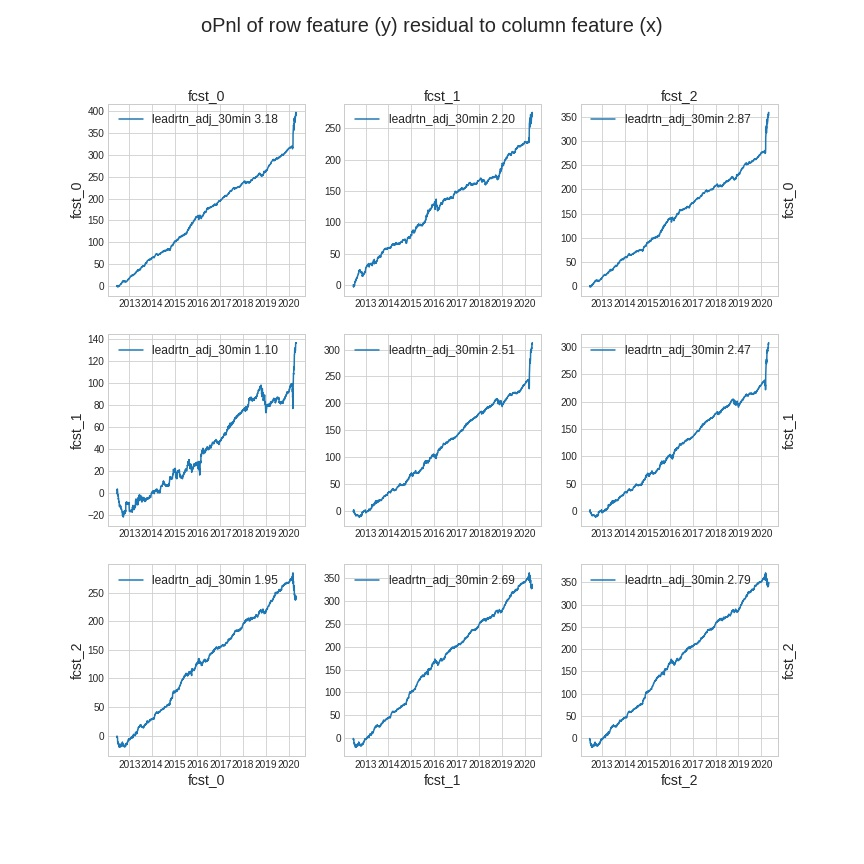

In [20]:
# OnlineRunner_90531f28c
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_90531f28c'
BASELINE_NOTES = 'A basic baseline (no omega weights + quadratic + emas) but replacing feature wins by online clamping (on top of OnlineRunner_01ede913b)'
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_01ede913b' )
baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
        +['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',]
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        winsorize_target=False, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # util penalty
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=2,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
            + ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',]
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega='P',
        omega_lr=1e-2,
        omega_ridge=0.1,
        omega_shift=0.1,    
        # the transformer
        transformer=mx.HPSet(
            pre_normalize=True, pre_clip=3, quadratic=True, post_normalize=True, post_clip=3, 
            ema_halflifes=[13 * 5, 13 * 20, 13 * 40], 
        ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = baselined_forecasts[-2:] + [baseline.output_features[-1]]
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Forecast auto-correlations', results['static_autocorrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Forecast auto-correlations', result['roll_autocorrs'], h=2 )
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )   c

# OnlineRunner_1e827c7b1

## A basic baseline (no omega weights + quadratic + emas) but replacing feature_wins by online clip and no residaulization and disjoint returns. Built on top of OnlineRunner_90531f28c

100%|██████████| 709/709 [00:56<00:00, 12.47it/s]

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,14923728,0.888636,-0.98663,0.187821,-0.002561,6.556511e-06,-8.786270,-0.865532,0.781208,0.783334,0.74208
leadrtn_adj_30min_disjoint.1,NaN,14923728,0.888598,-0.98663,0.084746,-0.000345,1.192093e-07,-0.947373,-0.080078,0.781208,0.783334,0.74208
leadrtn_adj_30min_disjoint.2,NaN,14923728,0.888562,-0.98663,0.036824,-0.001465,2.145767e-06,-4.214961,-0.447557,0.781208,0.783334,0.74208


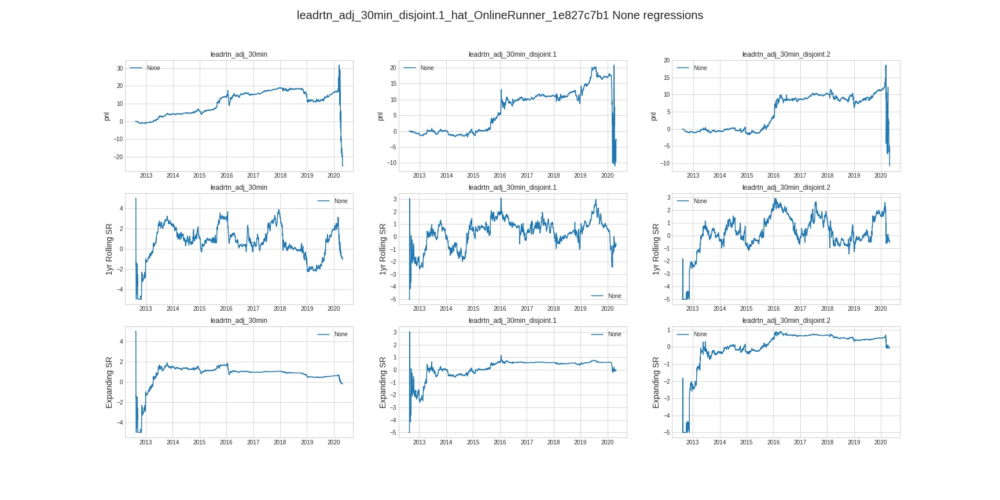

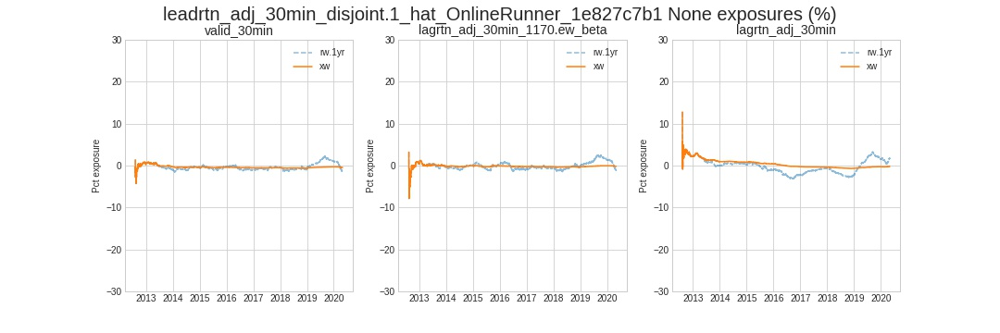

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,14923728,0.888636,-1.070975,3.217269,0.055308,0.003059,201.064087,9.113026,0.863832,0.858668,0.811067
leadrtn_adj_30min_disjoint.1,NaN,14923728,0.888598,-1.070975,0.157691,-0.004943,0.000024,-16.804785,-1.511905,0.863832,0.858668,0.811067
leadrtn_adj_30min_disjoint.2,NaN,14923728,0.888562,-1.070975,-0.106629,-0.006310,0.000040,-21.733768,-1.423732,0.863832,0.858668,0.811067


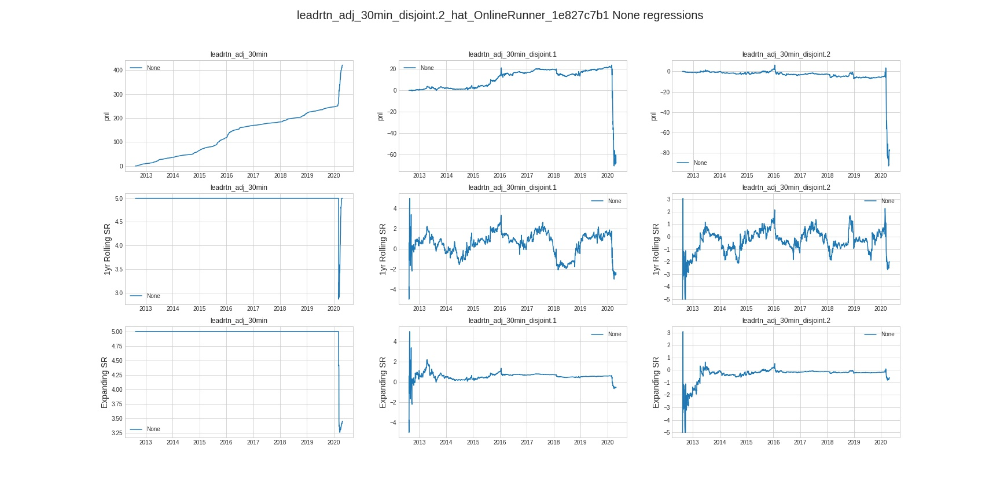

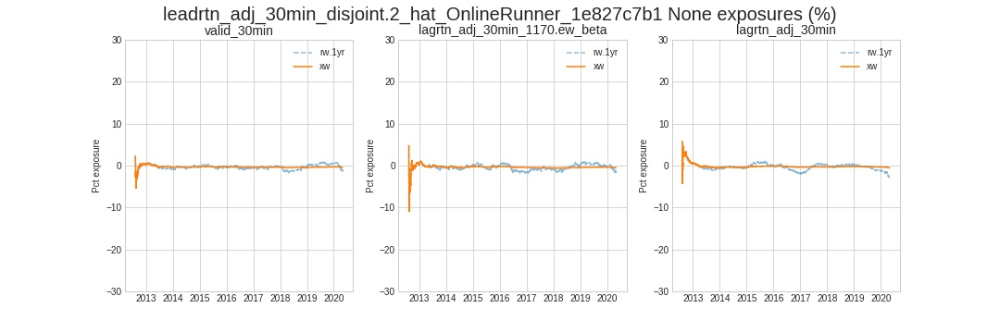

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,14923728,0.888636,1.190791e-10,0.323825,0.002264,0.000005,7.269710,2.434616,0.894026,0.889721,0.861555
leadrtn_adj_30min_disjoint.1,NaN,14923728,0.888598,1.190791e-10,0.163746,0.001245,0.000002,3.962492,1.448455,0.894026,0.889721,0.861555
leadrtn_adj_30min_disjoint.2,NaN,14923728,0.888562,1.190791e-10,0.105855,0.001196,0.000001,3.927033,1.459626,0.894026,0.889721,0.861555


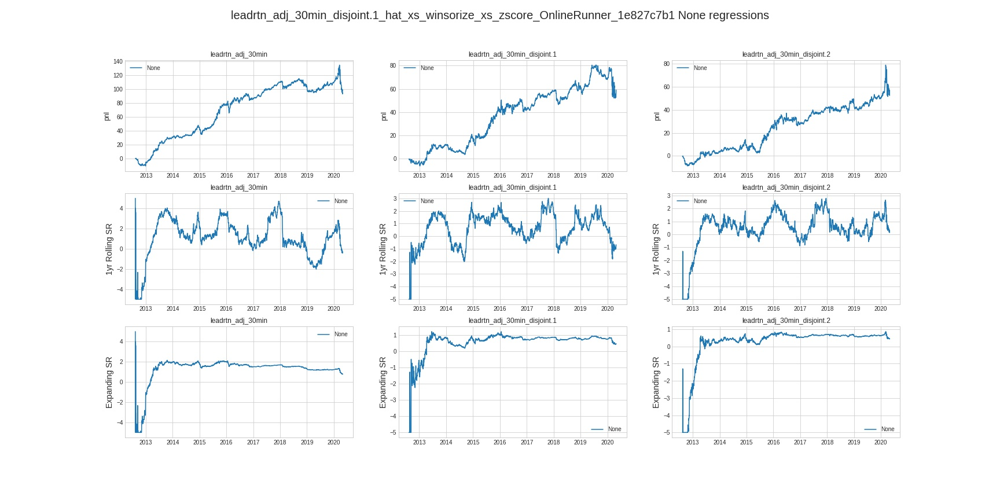

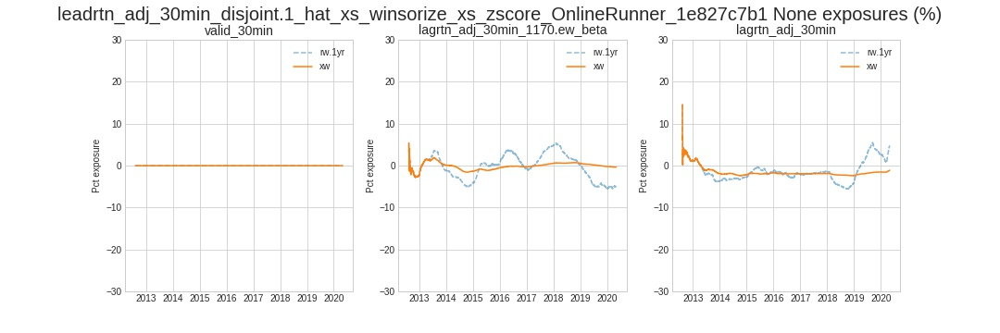

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,14923728,0.888636,-1.971709e-10,3.355629,0.029970,8.981824e-04,107.993217,16.139582,0.930139,0.924703,0.892575
leadrtn_adj_30min_disjoint.1,NaN,14923728,0.888598,-1.971709e-10,0.218673,0.000598,3.576279e-07,2.543000,0.897748,0.930139,0.924703,0.892575
leadrtn_adj_30min_disjoint.2,NaN,14923728,0.888562,-1.971709e-10,0.045165,0.000488,-2.384186e-07,1.158818,0.418095,0.930139,0.924703,0.892575


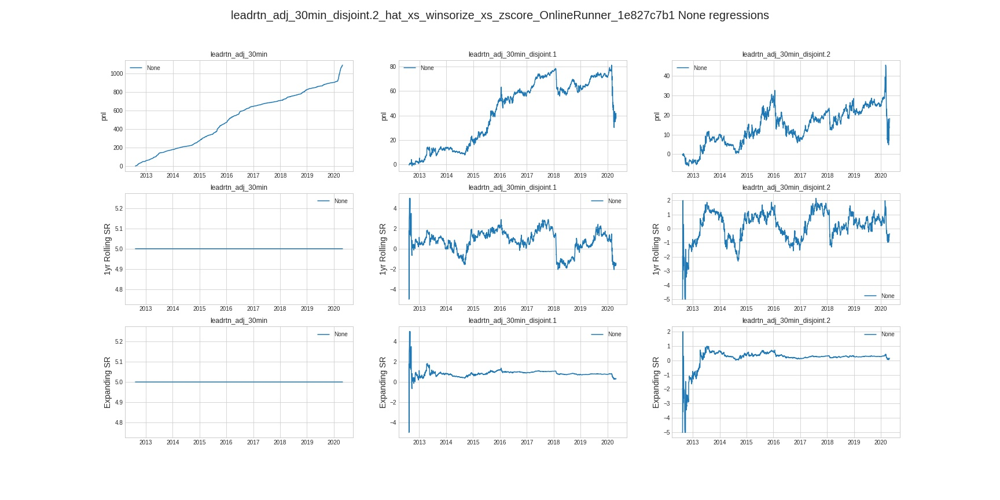

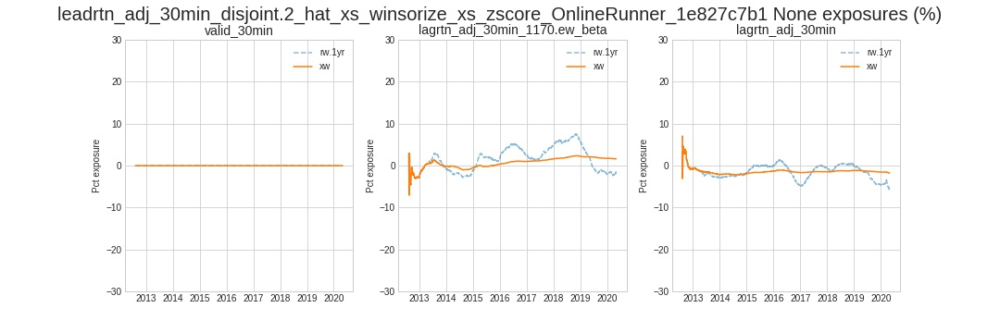

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c,fcst_1
leadrtn_adj_30min_disjoint.2_hat_xs_winsorize_xs_zscore_OnlineRunner_1e827c7b1,fcst_2


,fcst_0,fcst_1,fcst_2
fcst_0,1.000000,0.026239,0.554559
fcst_1,0.026239,1.000000,0.040013
fcst_2,0.554559,0.040013,1.000000


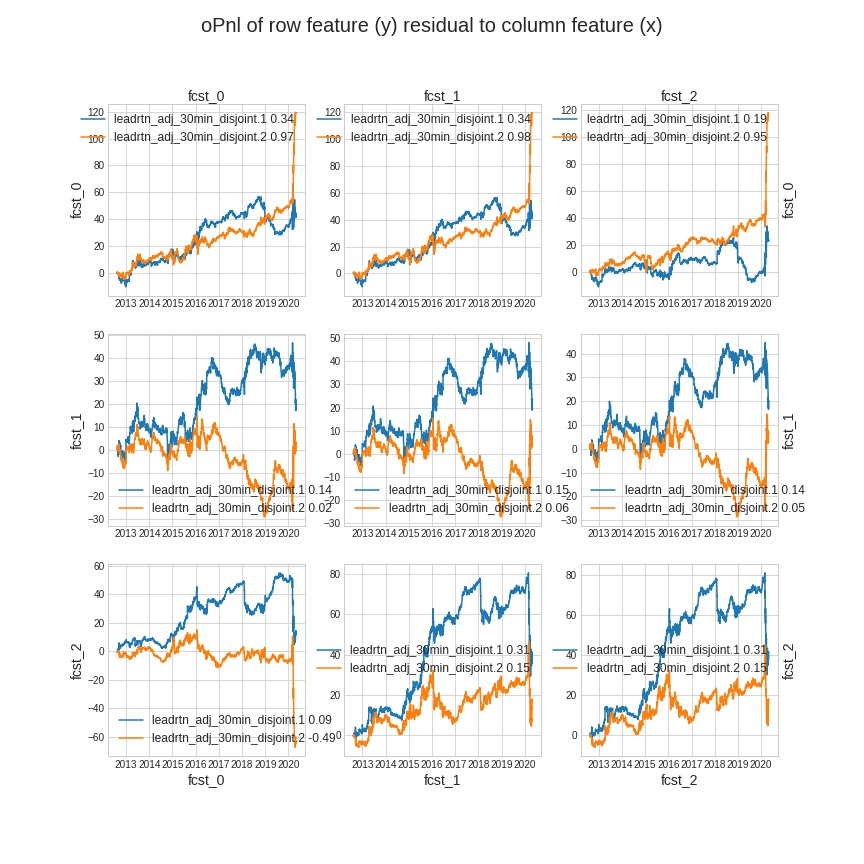

In [25]:
# OnlineRunner_1e827c7b1
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_1e827c7b1'
BASELINE_NOTES = ('A basic baseline (no omega weights + quadratic + emas) but replacing'
                  ' feature_wins by online clip and no residaulization and disjoint returns.' 
                  ' Built on top of OnlineRunner_90531f28c')
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_90531f28c' )
baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        []
        #+['leadrtn_adj_30min'] 
        +['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        winsorize_target=False, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # util penalty
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=2,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega='P',
        omega_lr=1e-2,
        omega_ridge=0.1,
        omega_shift=0.1,    
        # the transformer
        transformer=mx.HPSet(
            pre_normalize=True, pre_clip=3, quadratic=True, post_normalize=True, post_clip=3, 
            ema_halflifes=[13 * 5, 13 * 20, 13 * 40], 
        ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = baselined_forecasts[-2:] + [baseline.output_features[-1]]
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Forecast auto-correlations', results['static_autocorrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Forecast auto-correlations', result['roll_autocorrs'], h=2 )
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )

# OnlineRunner_7096cf84e

## Basic baseline (no omega weights + quadratic + online clip + emas) followed by post winsorization inside online rnn. Built on top of OnlineRunner_1e827c7b1

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,14627728,0.889366,1.263828,0.697622,0.005063,0.000026,17.718094,2.303471,0.693635,0.665885,0.634969
leadrtn_adj_30min_disjoint.1,NaN,14627728,0.889328,1.263828,0.148315,-0.003461,0.000012,-11.522958,-1.273193,0.693635,0.665885,0.634969
leadrtn_adj_30min_disjoint.2,NaN,14627728,0.889291,1.263828,0.112879,0.006229,0.000039,21.000547,1.820454,0.693635,0.665885,0.634969


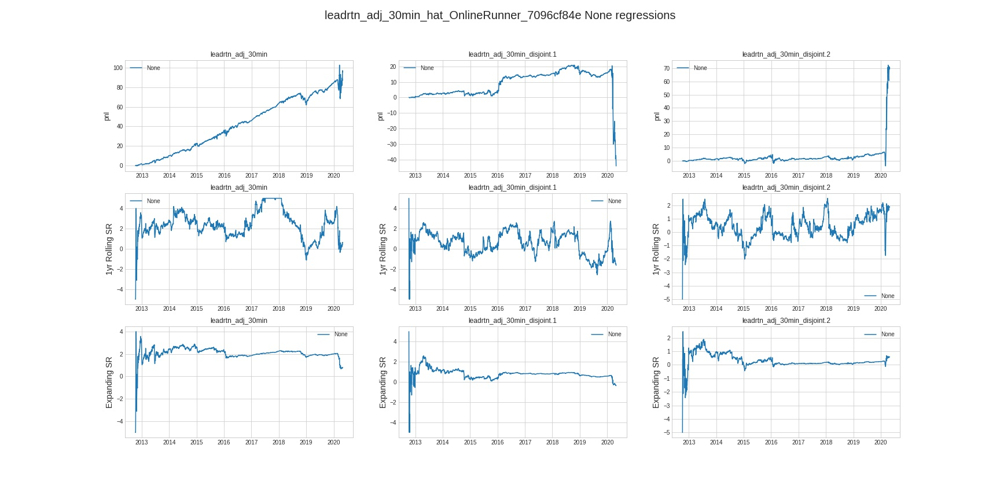

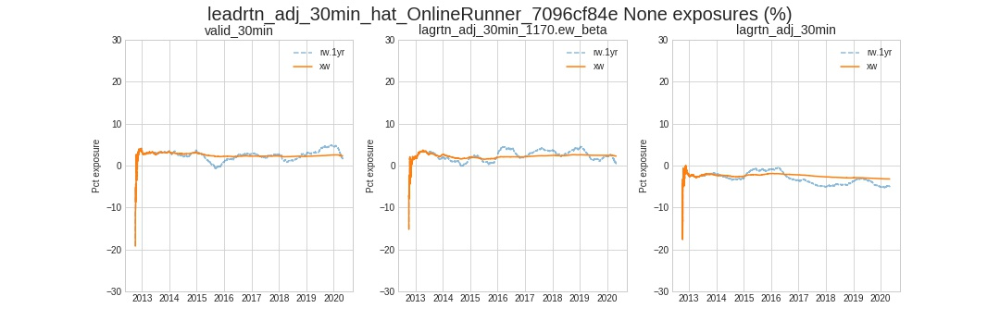

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,14627728,0.889366,2.917439e-11,1.114523,0.006849,0.000047,23.847969,8.483247,0.773764,0.742141,0.729152
leadrtn_adj_30min_disjoint.1,NaN,14627728,0.889328,2.917439e-11,0.208724,0.001092,0.000001,3.759077,1.699179,0.773764,0.742141,0.729152
leadrtn_adj_30min_disjoint.2,NaN,14627728,0.889291,2.917439e-11,0.162576,0.001726,0.000003,5.823749,2.336519,0.773764,0.742141,0.729152


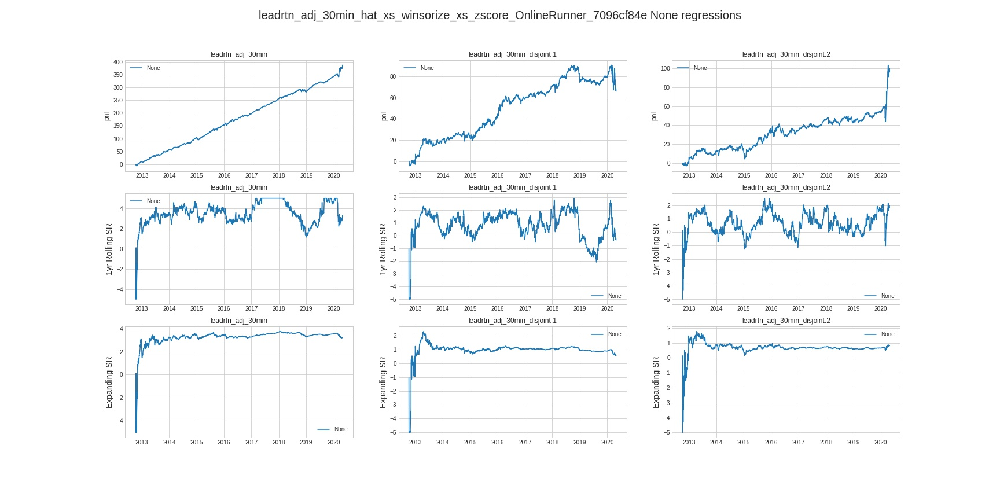

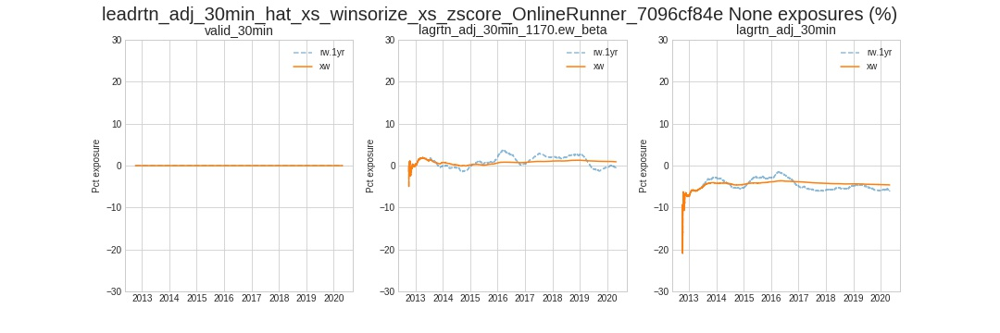

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c,fcst_1
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e,fcst_2


,fcst_0,fcst_1,fcst_2
fcst_0,1.000000,0.026123,0.832062
fcst_1,0.026123,1.000000,0.214282
fcst_2,0.832062,0.214282,1.000000


,x,fcst_0,fcst_1,fcst_2
y,tgt,,,
fcst_0,leadrtn_adj_30min,2.660279,2.614231,1.064187
fcst_1,leadrtn_adj_30min,2.976292,3.090529,2.447955
fcst_2,leadrtn_adj_30min,0.223116,2.872637,3.231864


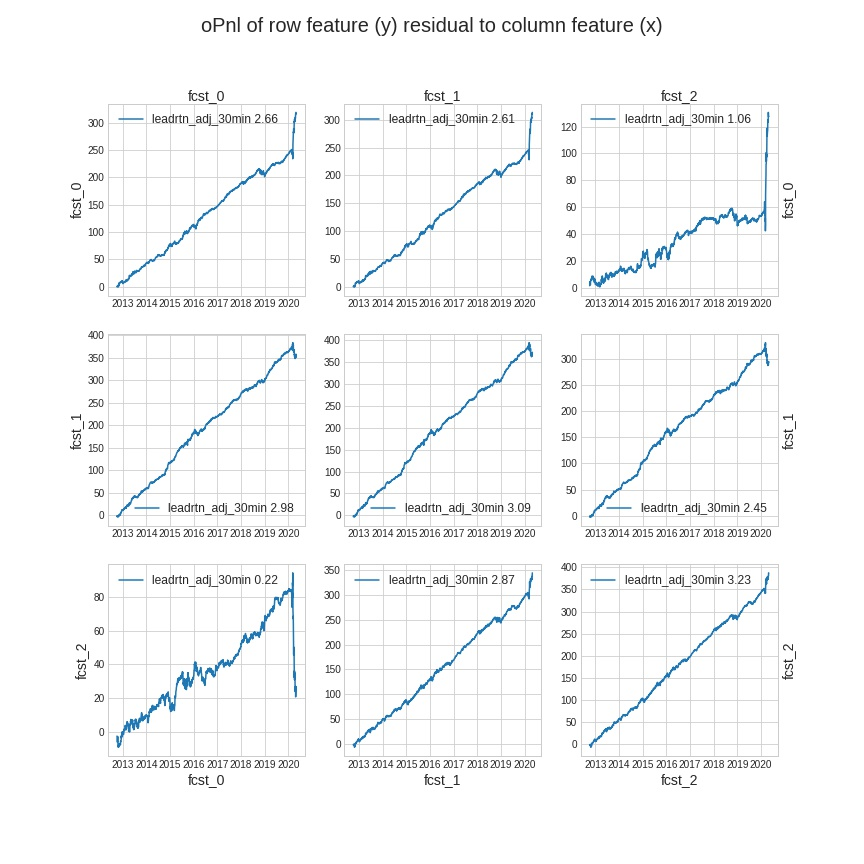

In [69]:
# OnlineRunner_7096cf84e
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_7096cf84e'
BASELINE_NOTES = '''
    Basic baseline (no omega weights + quadratic + online clip + emas) followed by post winsorization inside online rnn. 
    Built on top of OnlineRunner_1e827c7b1
'''
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_1e827c7b1' )
baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_1e827c7b1',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        []
        +['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=False, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # util penalty
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=2,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega=None,
        omega_lr=1e-2,
        omega_ridge=0.1,
        omega_shift=0.1,    
        # the transformer
        pre_transformer=mx.HPSet(
            pre_normalize=True, pre_clip=3, quadratic=True, post_normalize=True, post_clip=3, 
            ema_halflifes=[13 * 5, 13 * 20, 13 * 40], 
        ),
        # post winsroize the output
        post_transformer=mx.HPSet( winsorize=0.05, ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b', 
                        'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c',
                        baseline.output_features[-1]] 
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Forecast auto-correlations', results['static_autocorrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Forecast auto-correlations', result['roll_autocorrs'], h=2 )
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )

# OnlineRunner_737670420

## Basic baseline - similar to OnlineRunner_7096cf84e, except with online-rnn refactored to use psr loss and no kappa

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,14331728,0.890270,0.164162,0.783152,0.005694,0.000032,19.353371,2.163672,0.701262,0.673727,0.641391
leadrtn_adj_30min_disjoint.1,NaN,14331728,0.890230,0.164162,0.156192,-0.002816,0.000008,-8.983874,-1.043288,0.701262,0.673727,0.641391
leadrtn_adj_30min_disjoint.2,NaN,14331728,0.890193,0.164162,0.182202,0.005636,0.000032,18.532234,1.815623,0.701262,0.673727,0.641391


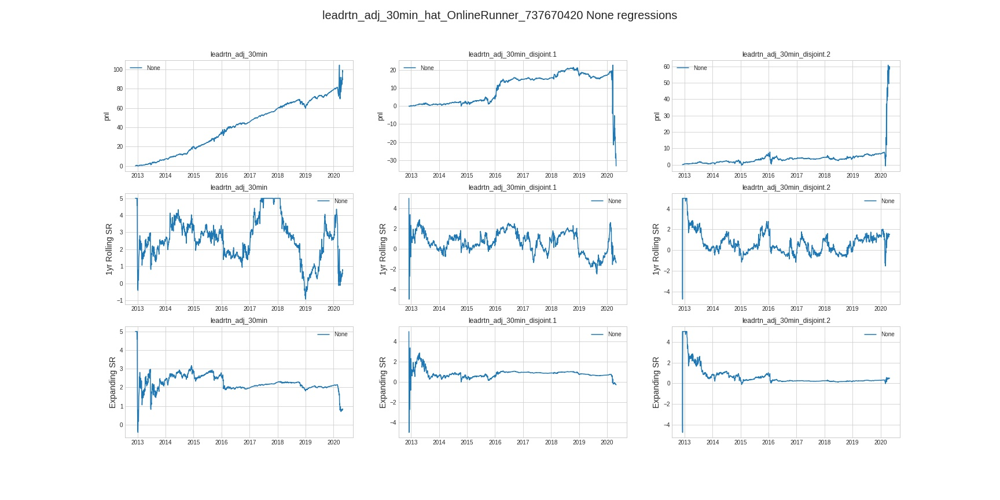

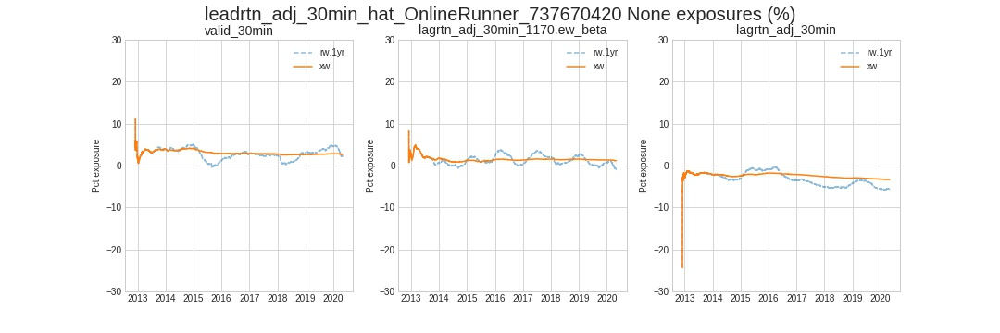

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,14331728,0.890270,-9.208021e-11,1.228283,0.006866,0.000047,23.587105,8.519461,0.769624,0.735825,0.720076
leadrtn_adj_30min_disjoint.1,NaN,14331728,0.890230,-9.208021e-11,0.258313,0.001145,0.000001,4.090467,1.989132,0.769624,0.735825,0.720076
leadrtn_adj_30min_disjoint.2,NaN,14331728,0.890193,-9.208021e-11,0.216939,0.001859,0.000003,5.535813,2.432801,0.769624,0.735825,0.720076


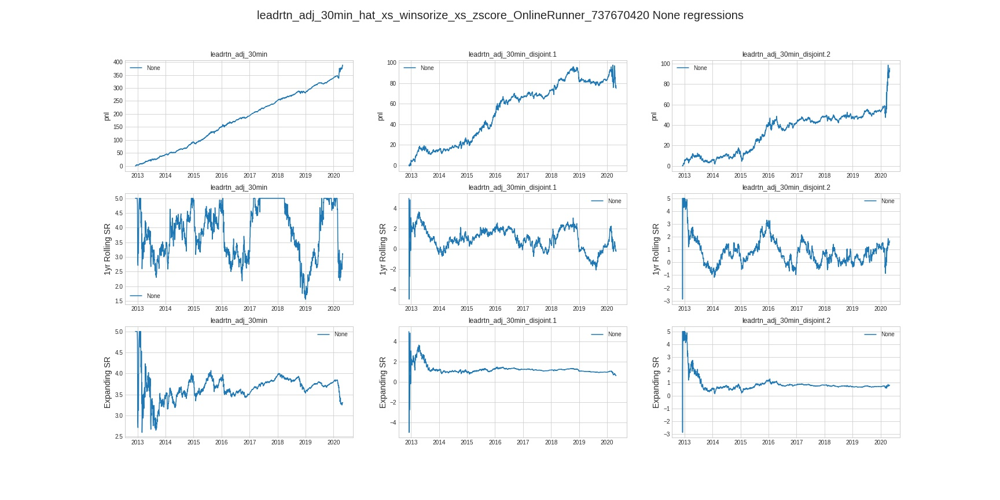

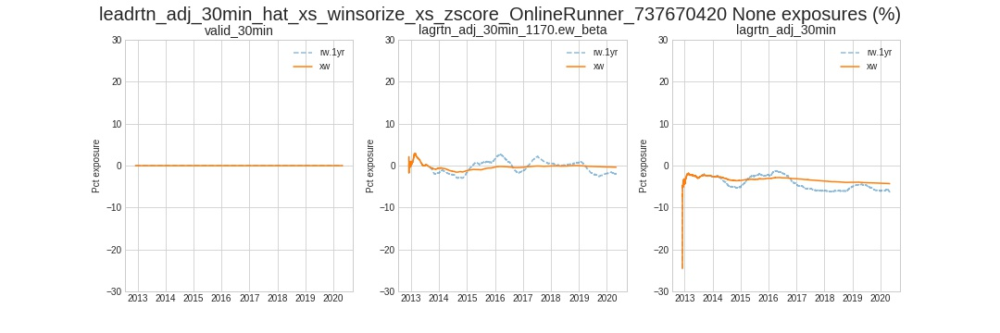

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c,fcst_1
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e,fcst_2
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420,fcst_3


,fcst_0,fcst_1,fcst_2,fcst_3
fcst_0,1.000000,0.025571,0.835835,0.826627
fcst_1,0.025571,1.000000,0.213233,0.231703
fcst_2,0.835835,0.213233,1.000000,0.962581
fcst_3,0.826627,0.231703,0.962581,1.000000


,x,fcst_0,fcst_1,fcst_2,fcst_3
y,tgt,,,,
fcst_0,leadrtn_adj_30min,2.632163,2.586620,1.001450,1.073112
fcst_1,leadrtn_adj_30min,2.996166,3.108247,2.457559,2.341928
fcst_2,leadrtn_adj_30min,0.258658,2.904475,3.270163,0.467980
fcst_3,leadrtn_adj_30min,0.308398,2.856970,0.401177,3.303470


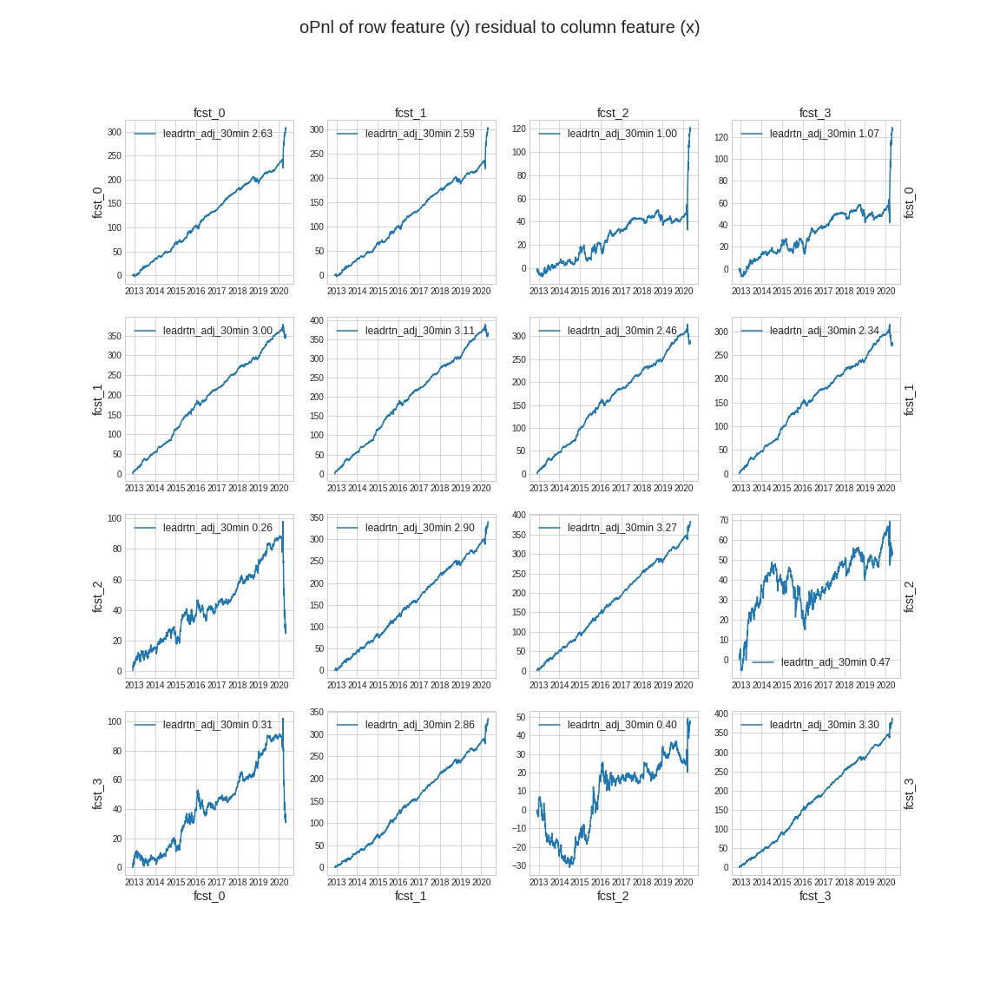

In [87]:
# OnlineRunner_7096cf84e
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_737670420'
BASELINE_NOTES = '''
    Basic baseline - similar to OnlineRunner_7096cf84e, except with online-rnn refactored to use psr loss and no kappa
'''
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_7096cf84e' )
baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_1e827c7b1',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        []
        +['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=False, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=50,
        kappa=None,  # variance penalty
        halflife_kappa=10000, # halflife for vraiance
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=1,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega=None,
        omega_lr=1e-2,
        omega_ridge=0.1,
        omega_shift=0.1,    
        # the transformer
        pre_transformer=mx.HPSet(
            pre_normalize=True, pre_clip=3, quadratic=True, post_normalize=True, post_clip=3, 
            ema_halflifes=[13 * 5, 13 * 20, 13 * 40], 
        ),
        # post winsroize the output
        post_transformer=mx.HPSet( winsorize=0.05, ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b', 
                        'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c',
                        'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',
                        baseline.output_features[-1]] 
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Forecast auto-correlations', results['static_autocorrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Forecast auto-correlations', result['roll_autocorrs'], h=2 )
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )

# OnlineRunner_f2964a6d1

## Basic baseline - similar to OnlineRunner_737670420 but with kappa on pnl-variance

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,14035728,0.890611,0.208368,0.781488,0.005610,0.000031,19.088190,1.987392,0.691083,0.661928,0.626497
leadrtn_adj_30min_disjoint.1,NaN,14035728,0.890570,0.208368,0.144807,-0.002380,0.000006,-7.104456,-0.823384,0.691083,0.661928,0.626497
leadrtn_adj_30min_disjoint.2,NaN,14035728,0.890532,0.208368,0.098242,0.006035,0.000036,19.440115,1.870076,0.691083,0.661928,0.626497


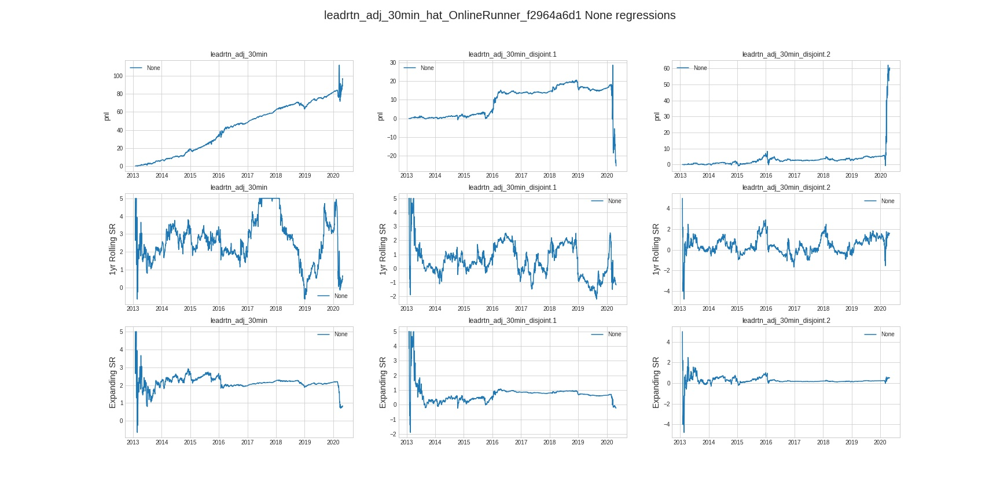

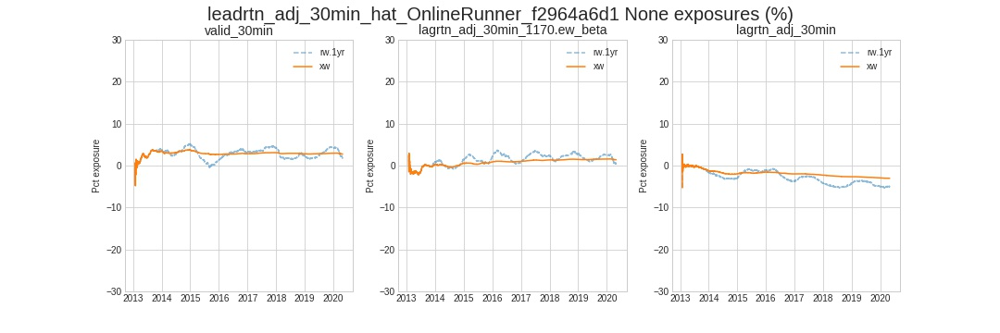

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,14035728,0.890611,3.532107e-11,1.252907,0.007242,0.000052,24.326536,8.670429,0.733935,0.69691,0.682309
leadrtn_adj_30min_disjoint.1,NaN,14035728,0.890570,3.532107e-11,0.229857,0.001036,0.000001,3.740262,1.783176,0.733935,0.69691,0.682309
leadrtn_adj_30min_disjoint.2,NaN,14035728,0.890532,3.532107e-11,0.161819,0.001709,0.000003,5.270456,2.293379,0.733935,0.69691,0.682309


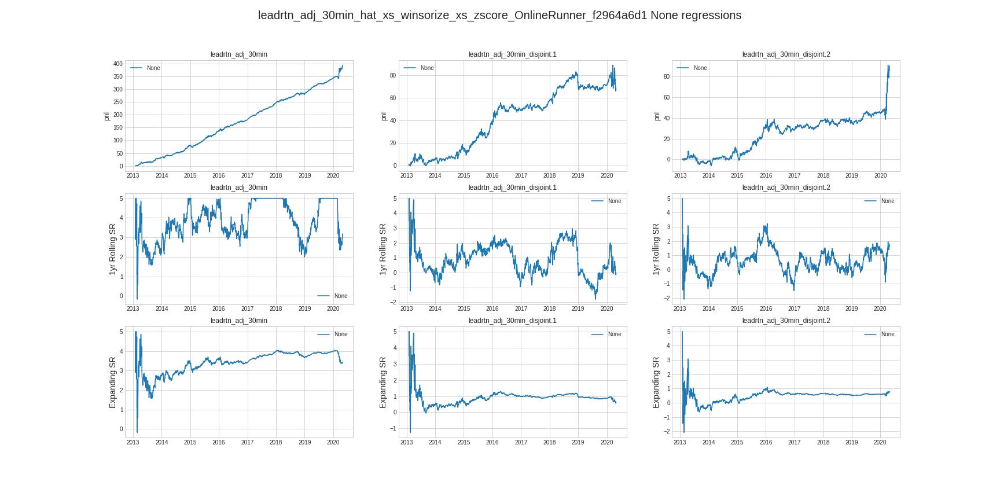

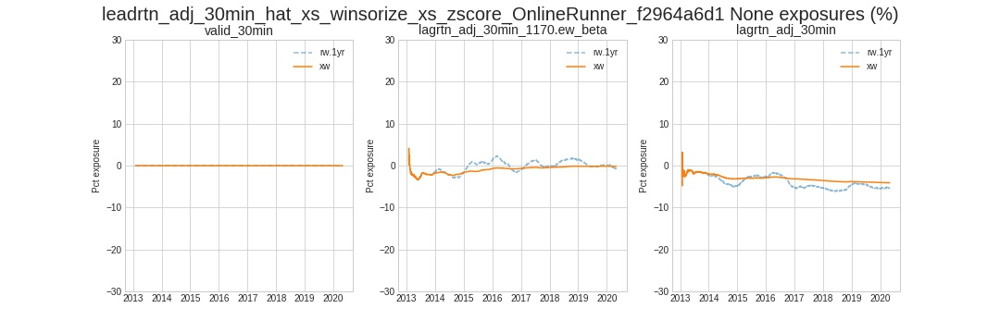

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420,fcst_1
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f2964a6d1,fcst_2


,fcst_0,fcst_1,fcst_2
fcst_0,1.000000,0.963362,0.920990
fcst_1,0.963362,1.000000,0.943401
fcst_2,0.920990,0.943401,1.000000


,x,fcst_0,fcst_1,fcst_2
y,tgt,,,
fcst_0,leadrtn_adj_30min,3.270334,0.511268,0.369713
fcst_1,leadrtn_adj_30min,0.343362,3.283299,0.145643
fcst_2,leadrtn_adj_30min,1.036278,1.260050,3.428373


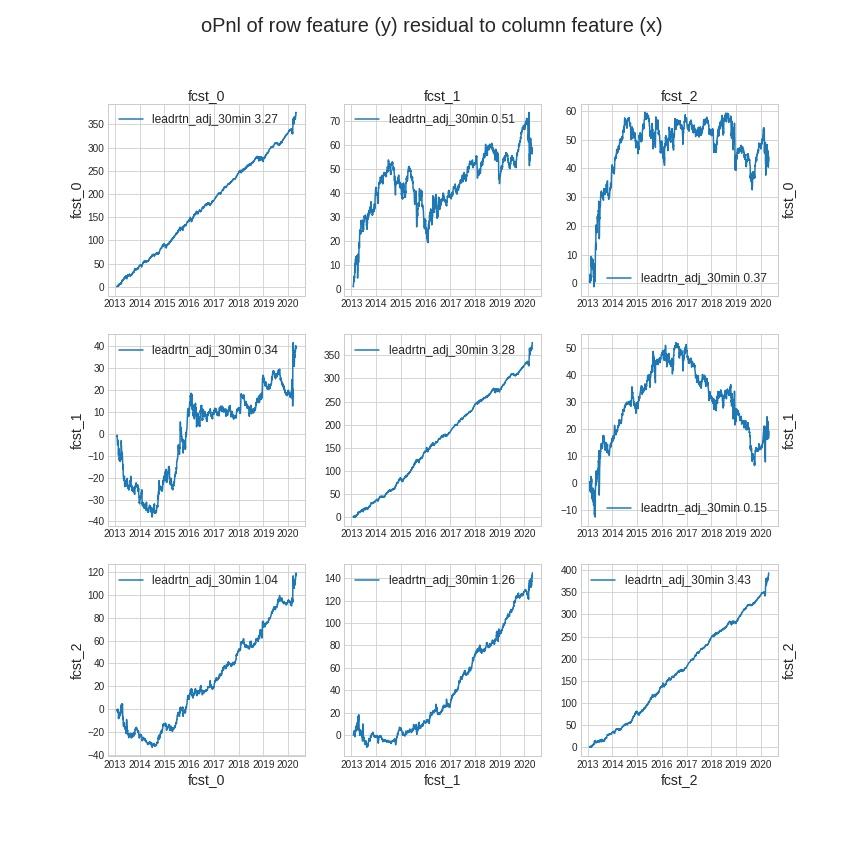

In [93]:
# OnlineRunner_f2964a6d1
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_f2964a6d1'
BASELINE_NOTES = '''
    Basic baseline - similar to OnlineRunner_737670420 but with kappa on pnl-variance
'''
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_737670420' )
baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_1e827c7b1',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        []
        +['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=False, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=50,
        kappa=1,  # variance penalty
        halflife_kappa=10000, # halflife for vraiance
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=1,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega=None,
        omega_lr=1e-2,
        omega_ridge=0.1,
        omega_shift=0.1,    
        # the transformer
        pre_transformer=mx.HPSet(
            pre_normalize=True, pre_clip=3, quadratic=True, post_normalize=True, post_clip=3, 
            ema_halflifes=[13 * 5, 13 * 20, 13 * 40], 
        ),
        # post winsroize the output
        post_transformer=mx.HPSet( winsorize=0.05, ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',
                        'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420',
                        baseline.output_features[-1]] 
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Forecast auto-correlations', results['static_autocorrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Forecast auto-correlations', result['roll_autocorrs'], h=2 )
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )

# OnlineRunner_b2fc57cfd

## P omega weights on top of OnlineRunner_f2964a6d1 (without kappa on pnl-variance)

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,13739728,0.890673,0.138726,0.698364,0.005127,0.000026,17.006886,1.998397,0.731746,0.706765,0.673539
leadrtn_adj_30min_disjoint.1,NaN,13739728,0.890631,0.138726,0.108856,-0.002441,0.000006,-7.516942,-0.921448,0.731746,0.706765,0.673539
leadrtn_adj_30min_disjoint.2,NaN,13739728,0.890592,0.138726,0.138012,0.005829,0.000034,18.374825,1.813462,0.731746,0.706765,0.673539


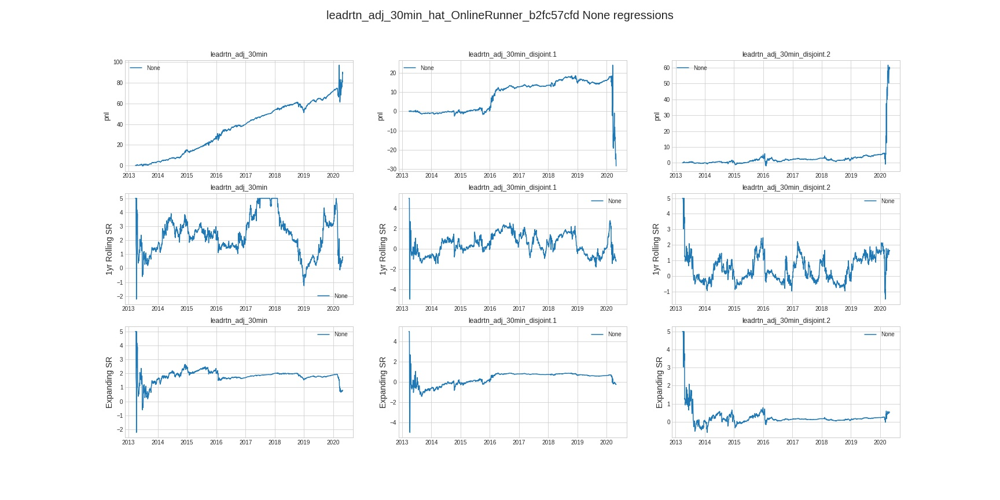

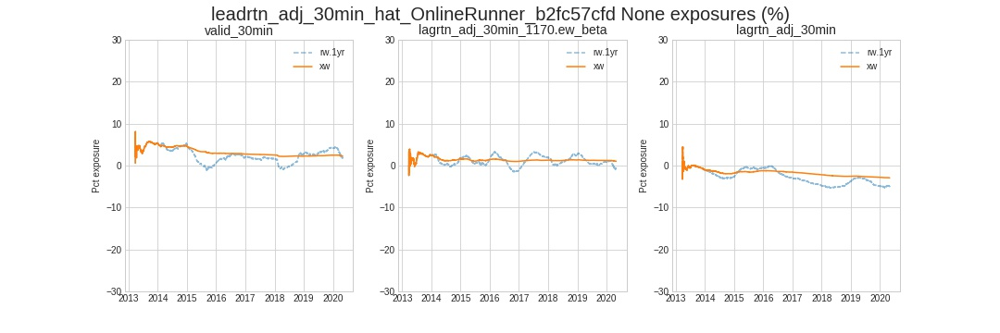

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,13739728,0.890673,2.555953e-11,1.098763,0.006366,0.000041,21.236788,7.665973,0.786265,0.754109,0.737543
leadrtn_adj_30min_disjoint.1,NaN,13739728,0.890631,2.555953e-11,0.222497,0.001221,0.000001,3.722370,1.770069,0.786265,0.754109,0.737543
leadrtn_adj_30min_disjoint.2,NaN,13739728,0.890592,2.555953e-11,0.201079,0.001777,0.000003,5.392499,2.292563,0.786265,0.754109,0.737543


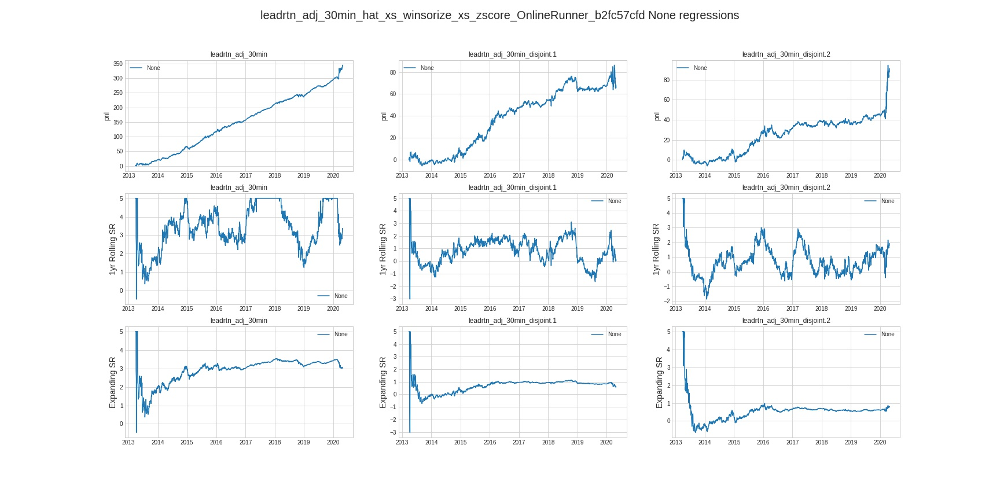

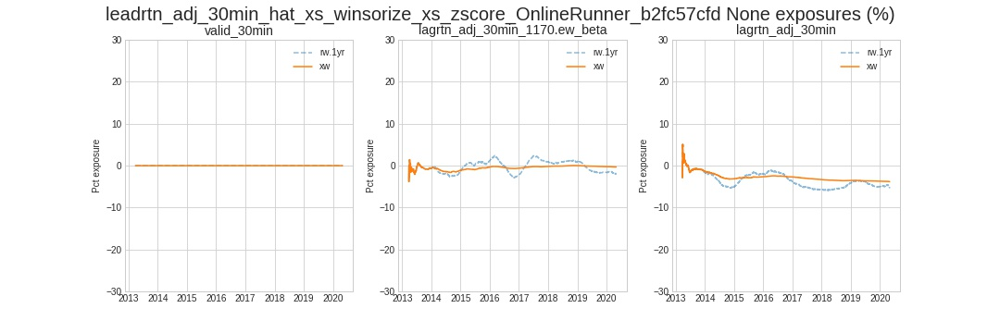

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420,fcst_1
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f2964a6d1,fcst_2
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_b2fc57cfd,fcst_3


,fcst_0,fcst_1,fcst_2,fcst_3
fcst_0,1.000000,0.965367,0.928436,0.930825
fcst_1,0.965367,1.000000,0.950470,0.972894
fcst_2,0.928436,0.950470,1.000000,0.940157
fcst_3,0.930825,0.972894,0.940157,1.000000


,x,fcst_0,fcst_1,fcst_2,fcst_3
y,tgt,,,,
fcst_0,leadrtn_adj_30min,3.274523,0.402151,0.277171,1.413970
fcst_1,leadrtn_adj_30min,0.418584,3.311230,0.111465,1.713784
fcst_2,leadrtn_adj_30min,1.022530,1.153337,3.433100,2.172447
fcst_3,leadrtn_adj_30min,-0.114176,-0.880359,-0.761718,3.063700


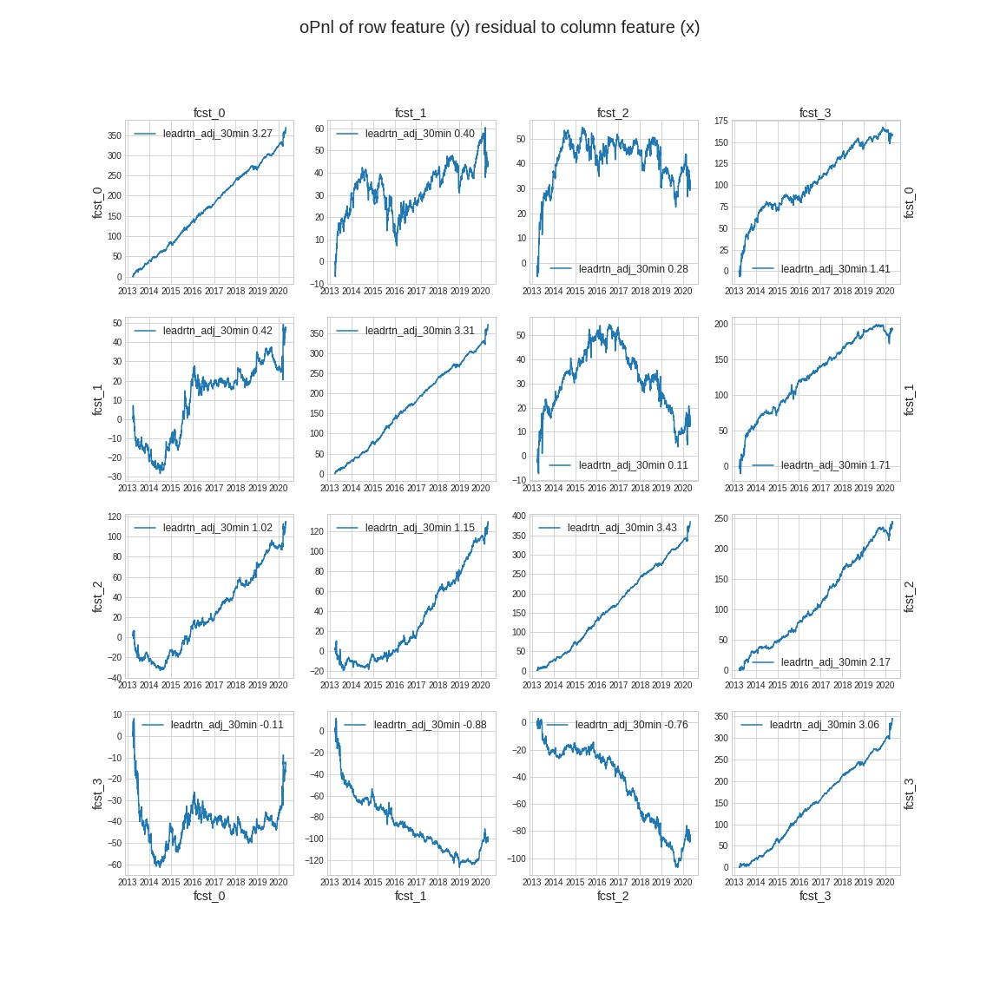

In [103]:
# OnlineRunner_b2fc57cfd
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_b2fc57cfd'
BASELINE_NOTES = '''
    P omega weights on top of OnlineRunner_f2964a6d1 (without kappa on pnl-variance)
'''
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_f2964a6d1' )
baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_1e827c7b1',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f2964a6d1',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        []
        +['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=False, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=50,
        kappa=None,  # variance penalty
        halflife_kappa=1000, # halflife for vraiance
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=1,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega='P',
        omega_lr=1,
        omega_ridge=1e-2,
        omega_shift=None,    
        # the transformer
        pre_transformer=mx.HPSet(
            pre_normalize=True, pre_clip=3, quadratic=True, post_normalize=True, post_clip=3, 
            ema_halflifes=[13 * 5, 13 * 20, 13 * 40], 
        ),
        # post winsroize the output
        post_transformer=mx.HPSet( winsorize=0.05, ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',
                        'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420',
                        'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f2964a6d1',
                        baseline.output_features[-1]] 
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Forecast auto-correlations', results['static_autocorrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Forecast auto-correlations', result['roll_autocorrs'], h=2 )
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )

# OnlineRunner_3eba87e24

## P omega weights and kappa on top of OnlineRunner_b2fc57cfd 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,13443728,0.890710,0.241202,0.836277,0.006362,0.000040,21.244843,2.813374,0.719384,0.690987,0.654112
leadrtn_adj_30min_disjoint.1,NaN,13443728,0.890668,0.241202,0.085096,-0.001601,0.000003,-3.940462,-0.650971,0.719384,0.690987,0.654112
leadrtn_adj_30min_disjoint.2,NaN,13443728,0.890627,0.241202,0.146132,0.004974,0.000025,15.709132,1.981601,0.719384,0.690987,0.654112


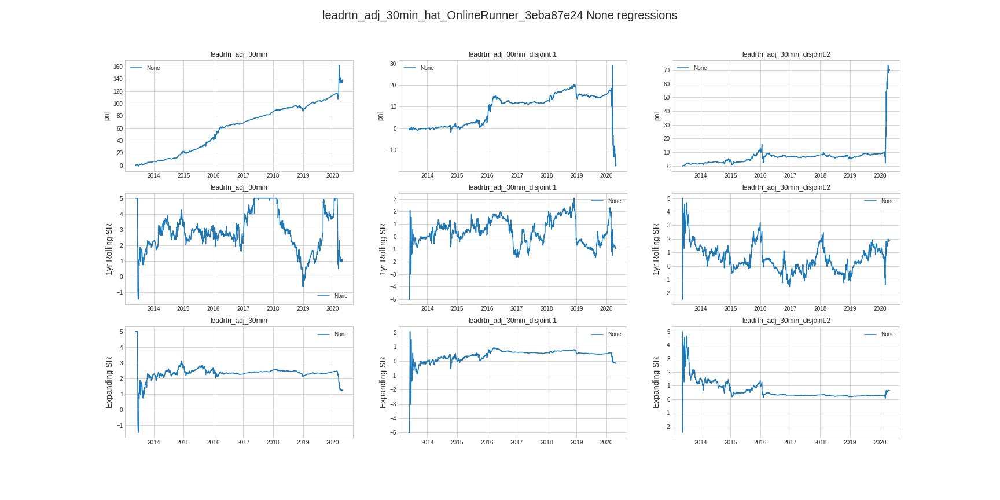

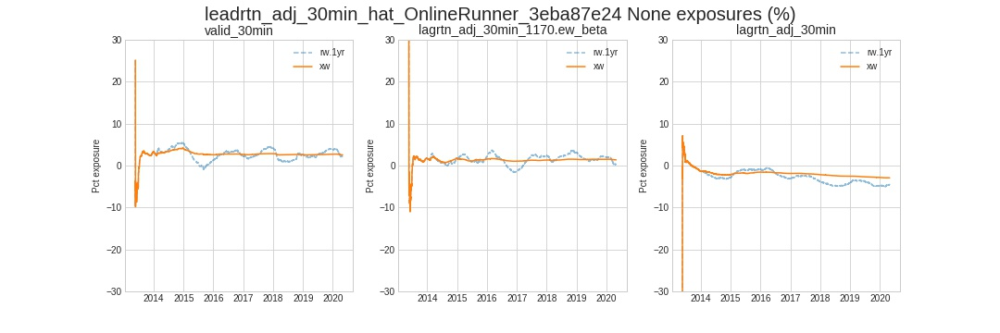

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,13443728,0.890710,4.778264e-12,1.266879,0.007218,0.000052,23.960388,9.112802,0.723777,0.689285,0.674432
leadrtn_adj_30min_disjoint.1,NaN,13443728,0.890668,4.778264e-12,0.156768,0.001196,0.000001,3.571072,1.795289,0.723777,0.689285,0.674432
leadrtn_adj_30min_disjoint.2,NaN,13443728,0.890627,4.778264e-12,0.146011,0.001563,0.000002,4.913555,2.288994,0.723777,0.689285,0.674432


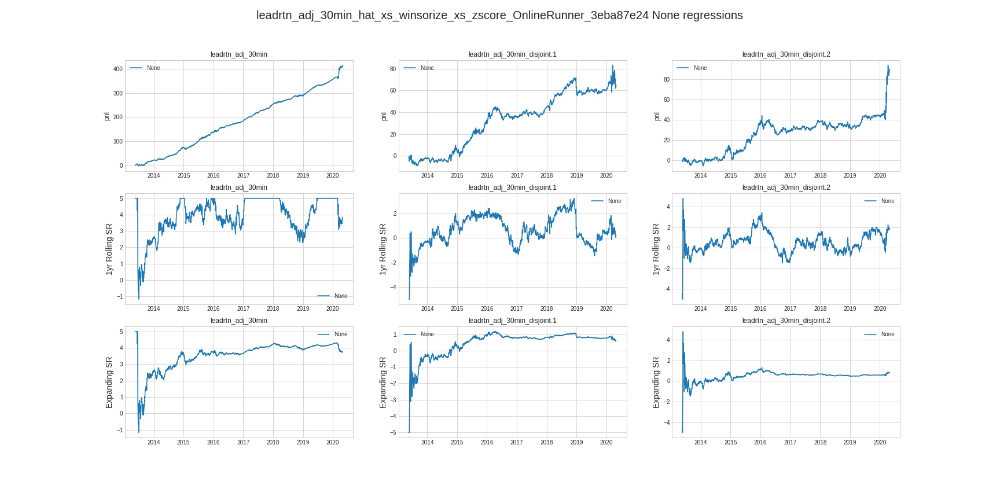

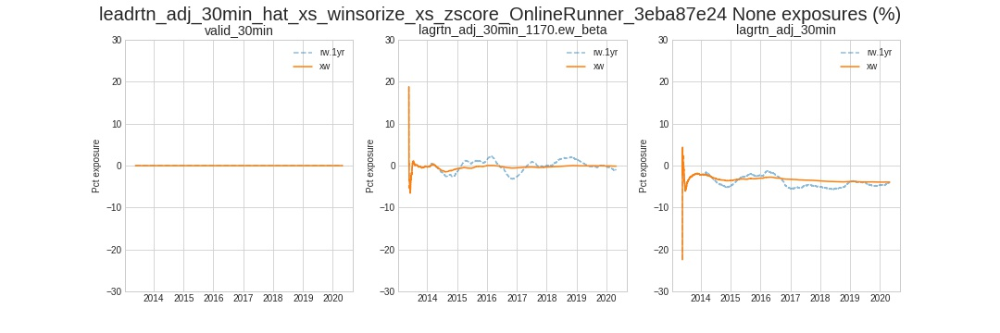

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420,fcst_1
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f2964a6d1,fcst_2
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_b2fc57cfd,fcst_3
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_3eba87e24,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.967024,0.932620,0.936736,0.862990
fcst_1,0.967024,1.000000,0.954714,0.976951,0.898866
fcst_2,0.932620,0.954714,1.000000,0.941924,0.951662
fcst_3,0.936736,0.976951,0.941924,1.000000,0.905814
fcst_4,0.862990,0.898866,0.951662,0.905814,1.000000


,x,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
y,tgt,,,,,
fcst_0,leadrtn_adj_30min,3.242803,0.294164,0.125265,1.336833,0.493311
fcst_1,leadrtn_adj_30min,0.494023,3.293918,-0.015204,1.763219,0.342718
fcst_2,leadrtn_adj_30min,1.149404,1.240307,3.465885,2.214331,0.358862
fcst_3,leadrtn_adj_30min,-0.077523,-0.998973,-0.825870,3.082741,-0.202562
fcst_4,leadrtn_adj_30min,1.244075,1.019101,0.421234,1.485241,3.783040


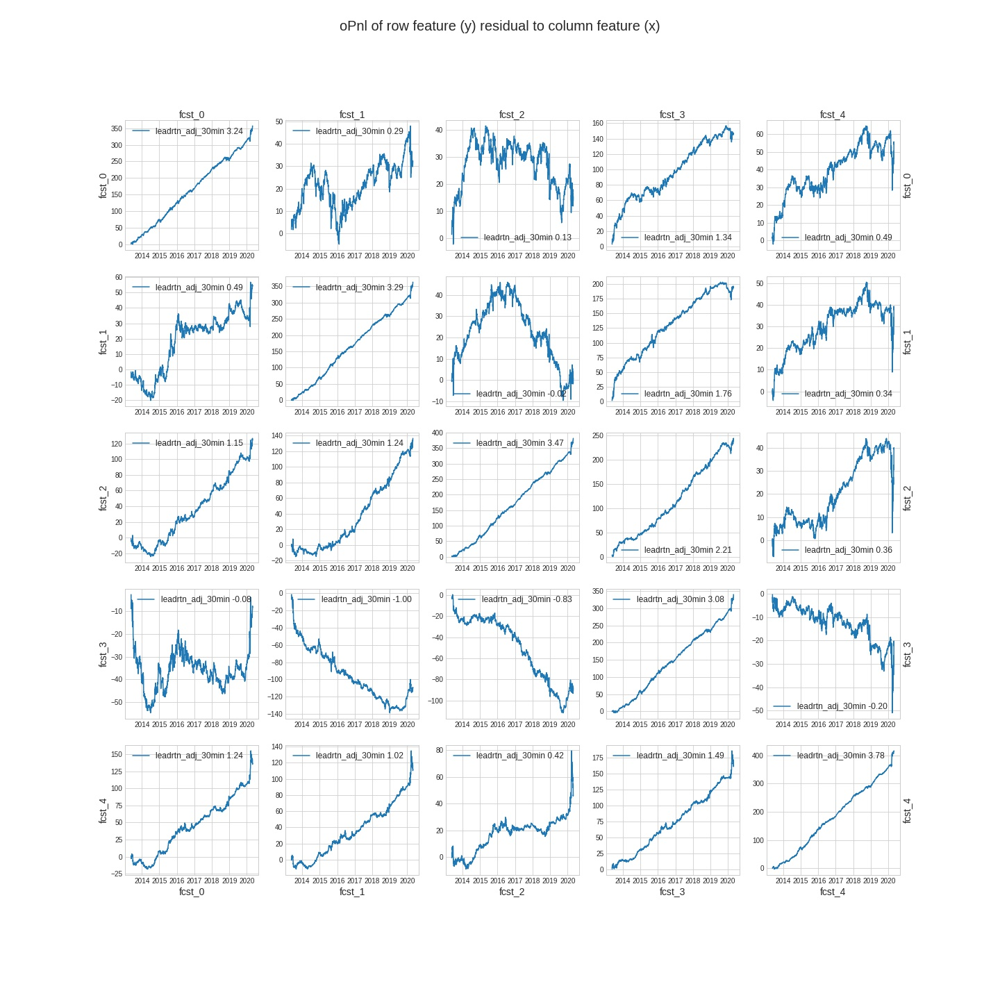

In [107]:
# OnlineRunner_3eba87e24
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = 'OnlineRunner_3eba87e24'
BASELINE_NOTES = '''P omega weights and kappa on top of OnlineRunner_b2fc57cfd '''
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_b2fc57cfd' )
baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_1e827c7b1',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f2964a6d1',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_b2fc57cfd',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        []
        +['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=False, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=50,
        kappa=2,  # variance penalty
        halflife_kappa=1000, # halflife for vraiance
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=1,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega='P',
        omega_lr=1,
        omega_ridge=1e-2,
        omega_shift=None,    
        # the transformer
        pre_transformer=mx.HPSet(
            pre_normalize=True, pre_clip=3, quadratic=True, post_normalize=True, post_clip=3, 
            ema_halflifes=[13 * 5, 13 * 20, 13 * 40], 
        ),
        # post winsroize the output
        post_transformer=mx.HPSet( winsorize=0.05, ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',
                        'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420',
                        'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f2964a6d1',
                        'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_b2fc57cfd',
                        baseline.output_features[-1]] 
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Forecast auto-correlations', results['static_autocorrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Forecast auto-correlations', result['roll_autocorrs'], h=2 )
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )


## basic pipeline with weight as a weight - not valid_30min. Built on top OnlineRunner_3eba87e24


100%|██████████| 2709/2709 [01:43<00:00, 26.14it/s]

/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/computation.py:604: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/computation.py:604: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,13147728,0.995204,0.546323,0.122617,-0.003010,0.000009,-9.804139,-0.378932,0.980359,0.970696,0.918867
leadrtn_adj_30min_disjoint.1,NaN,13147728,0.995158,0.546323,0.139768,-0.001221,0.000001,-4.795321,-0.197800,0.980359,0.970696,0.918867
leadrtn_adj_30min_disjoint.2,NaN,13147728,0.995113,0.546323,0.139004,0.002868,0.000008,10.177907,0.456482,0.980359,0.970696,0.918867


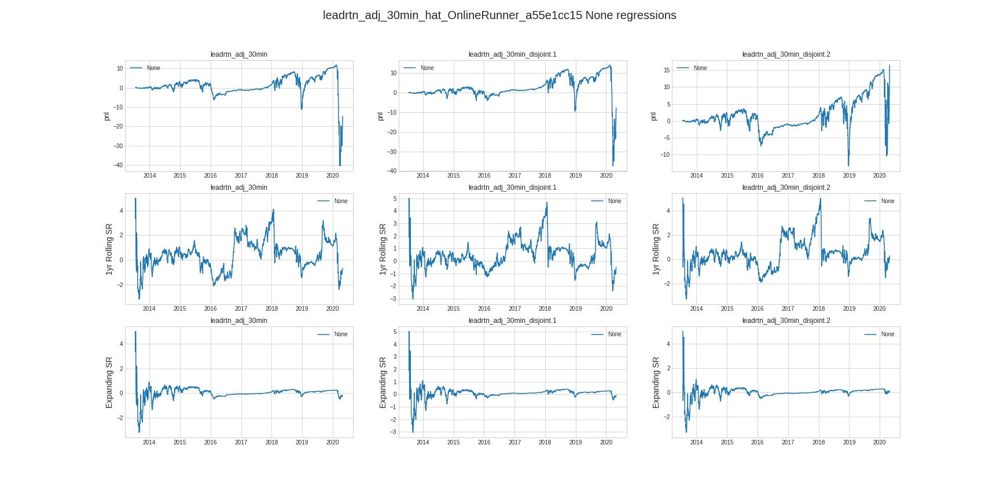

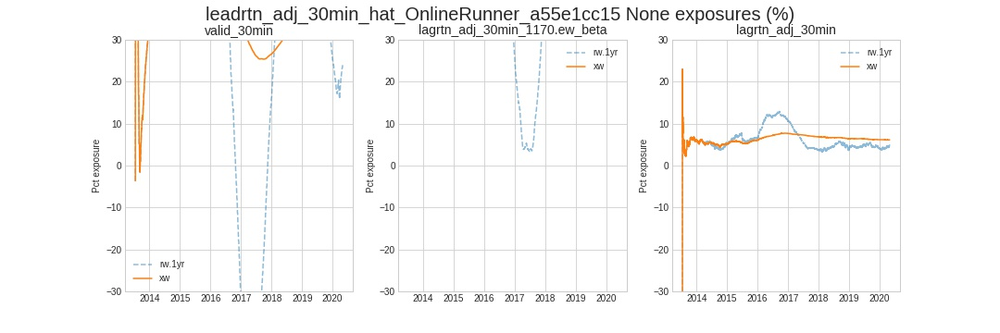

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,13147728,0.995204,-4.286944e-11,0.155798,0.001907,0.000004,5.322138,0.584661,0.985472,0.979612,0.96306
leadrtn_adj_30min_disjoint.1,NaN,13147728,0.995158,-4.286944e-11,0.168007,0.002405,0.000006,7.864654,0.904491,0.985472,0.979612,0.96306
leadrtn_adj_30min_disjoint.2,NaN,13147728,0.995113,-4.286944e-11,0.158846,0.002816,0.000008,9.667581,1.046095,0.985472,0.979612,0.96306


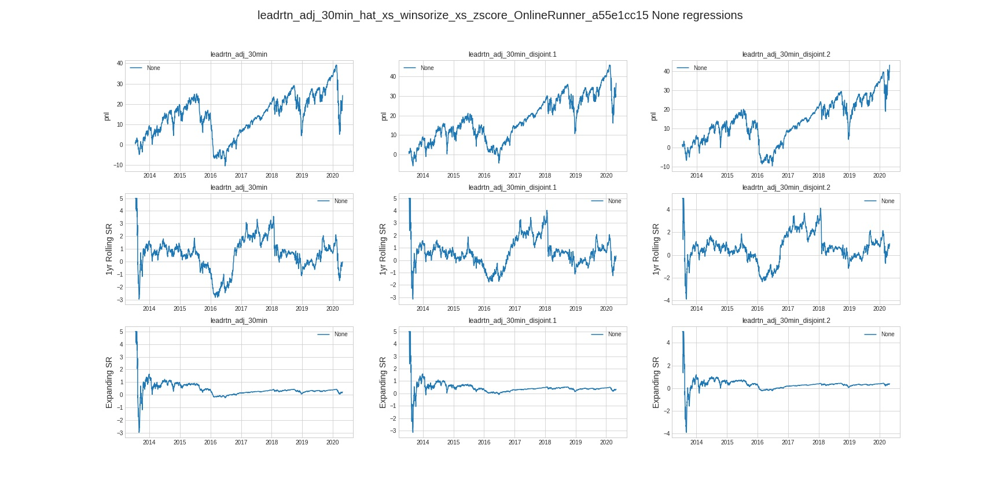

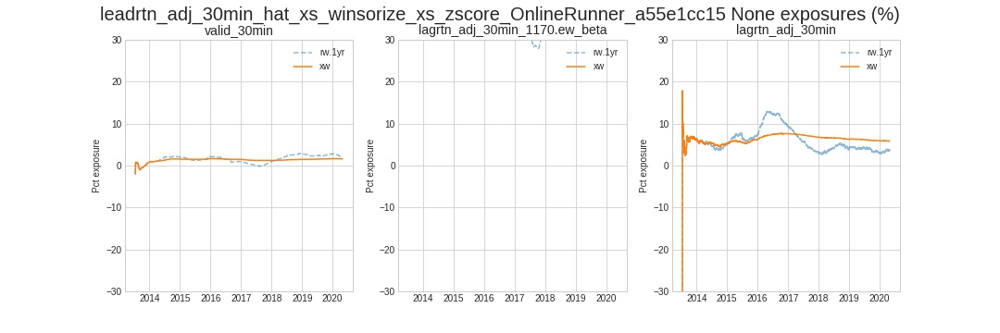

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_a55e1cc15,fcst_1


,fcst_0,fcst_1
fcst_0,1.000,0.096
fcst_1,0.096,1.000


,x,fcst_0,fcst_1
y,tgt,,
fcst_0,leadrtn_adj_30min,-0.298334,-0.314154
fcst_1,leadrtn_adj_30min,0.238376,0.225161


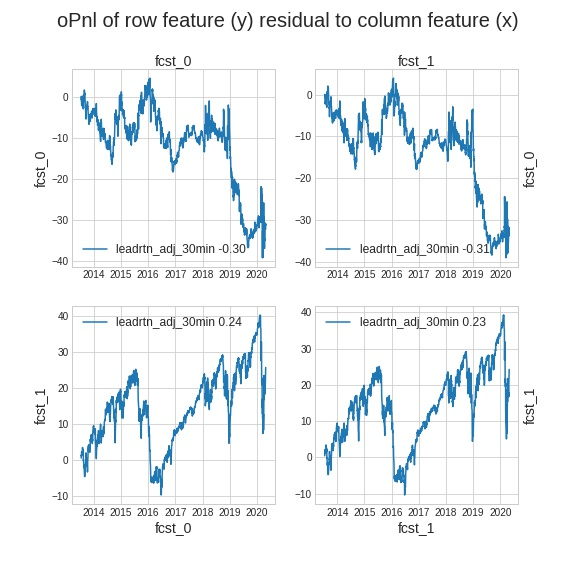

In [34]:
# with original wsum ema logic, no ortho
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = None
BASELINE_NOTES = '''basic pipeline with weight as a weight - not valid_30min. Built on top OnlineRunner_3eba87e24'''
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_3eba87e24' )
baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_1e827c7b1',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f2964a6d1',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_b2fc57cfd',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_3eba87e24',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        []
        +['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='weight',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=False, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=50,
        kappa=1e-4,  # variance penalty
        halflife_kappa=20, # halflife for vraiance
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=None,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega=None,
        omega_lr=1,
        omega_ridge=1e-2,
        omega_shift=None,    
        # the transformer
        pre_transformer=mx.HPSet(
            pre_normalize=True, pre_clip=3, quadratic=True, post_normalize=True, post_clip=3, 
            ema_halflifes=[13 * 5, 13 * 20, 13 * 40], 
        ),
        # post winsroize the output
        post_transformer=mx.HPSet( winsorize=0.05, ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if neededb
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',                        
                        baseline.output_features[-1]] 
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Forecast auto-correlations', results['static_autocorrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Forecast auto-correlations', result['roll_autocorrs'], h=2 )
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )

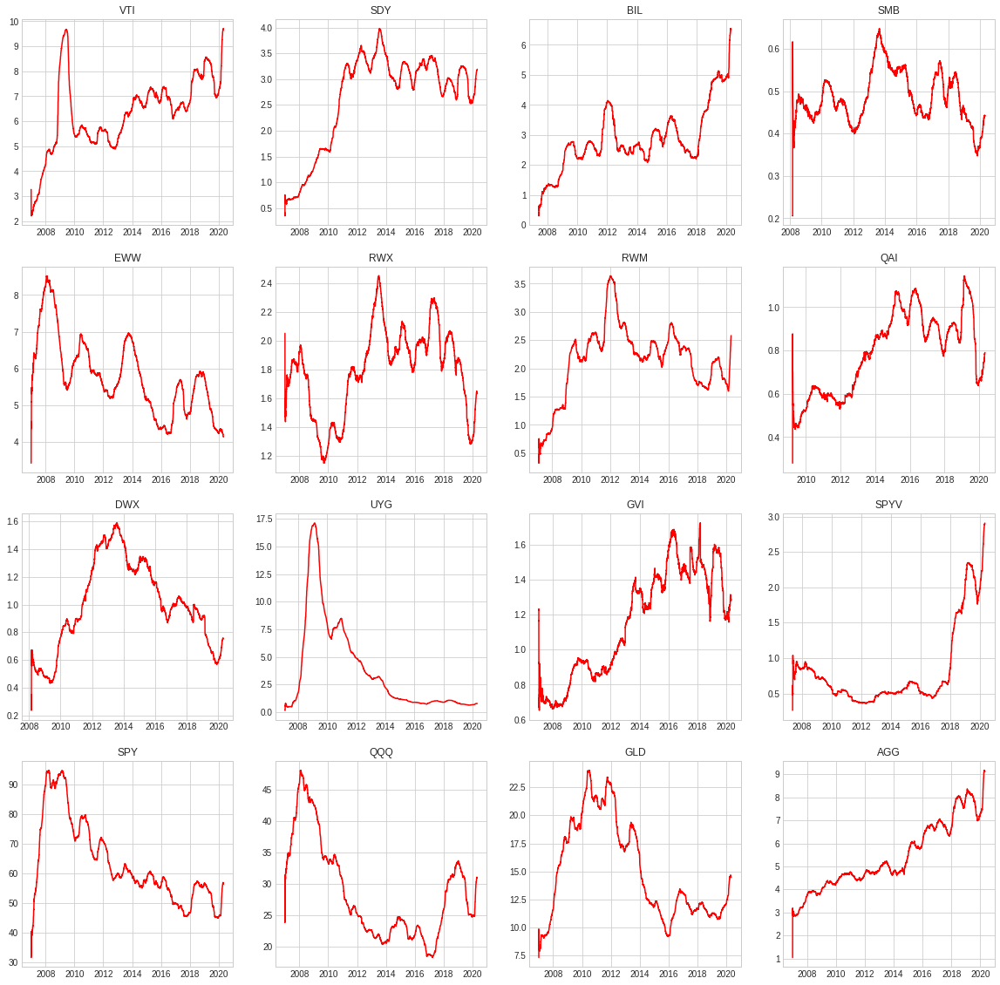

In [98]:
#W = da.loc[:,:,'weight'].to_dataframe_mx()
figure( figsize=(20,20))
for i, sym in enumerate( random_sample( W.columns, 12)+['SPY', 'QQQ', 'GLD', 'AGG'] ) :
    ax = subplot( 4,4, i+1)
    ax.plot( W.loc[:,sym], '-r')
    ax.set_title( sym )
    
figure( figsize=(20,5))
h = np.histogram( W.mean(0), density=False, bins=20)
W.mean(0).hist(bins=20, ax=subplot(121))
ax = subplot(122)
ax.plot( (h[0]*(h[1][:-1]+h[1][1:])/2 ).cumsum() )    

100%|██████████| 2709/2709 [02:13<00:00, 20.29it/s]

/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/computation.py:604: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/computation.py:604: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,13147728,0.995204,13.927805,0.219523,-0.000691,4.768372e-07,-1.101736,-0.194903,0.881031,0.869768,0.833129
leadrtn_adj_30min_disjoint.1,NaN,13147728,0.995158,13.927805,0.095416,-0.001505,2.264977e-06,-5.459471,-1.133485,0.881031,0.869768,0.833129
leadrtn_adj_30min_disjoint.2,NaN,13147728,0.995113,13.927805,0.185153,0.003239,1.049042e-05,11.270187,1.713497,0.881031,0.869768,0.833129


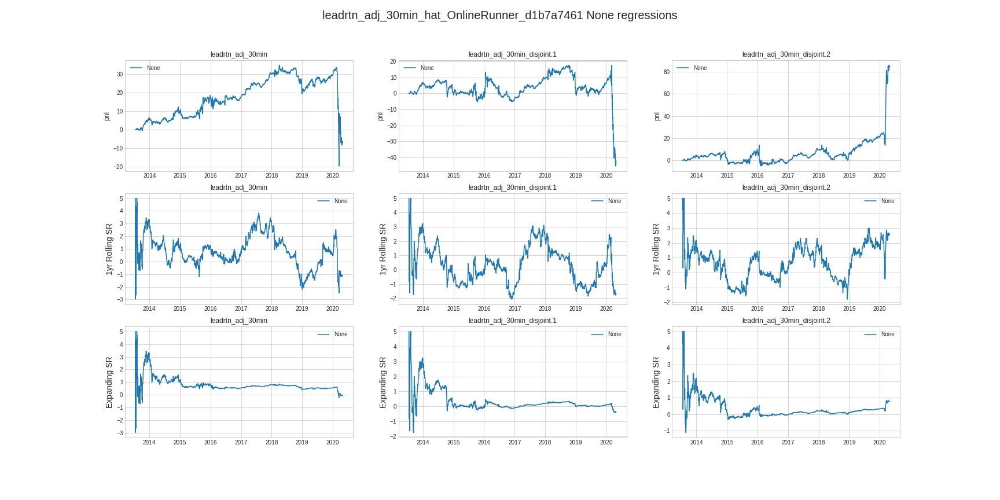

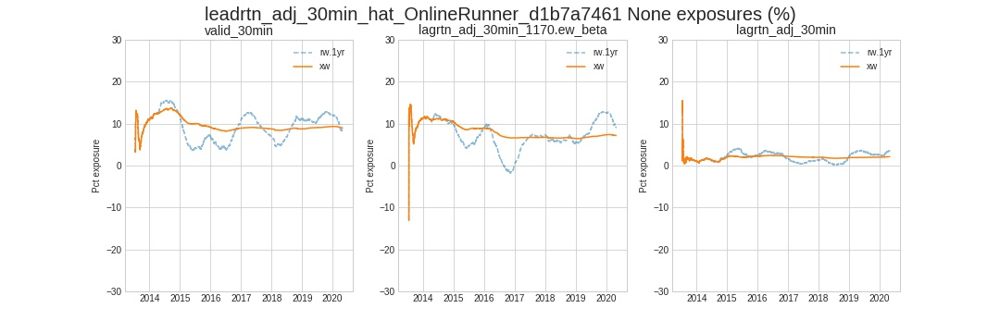

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,13147728,0.995204,7.455556e-12,0.214215,0.000810,6.556511e-07,1.898055,0.671445,0.901225,0.890439,0.864502
leadrtn_adj_30min_disjoint.1,NaN,13147728,0.995158,7.455556e-12,0.079037,-0.000345,1.192093e-07,-0.233073,-0.092547,0.901225,0.890439,0.864502
leadrtn_adj_30min_disjoint.2,NaN,13147728,0.995113,7.455556e-12,0.137056,0.000946,8.940697e-07,3.431304,1.358542,0.901225,0.890439,0.864502


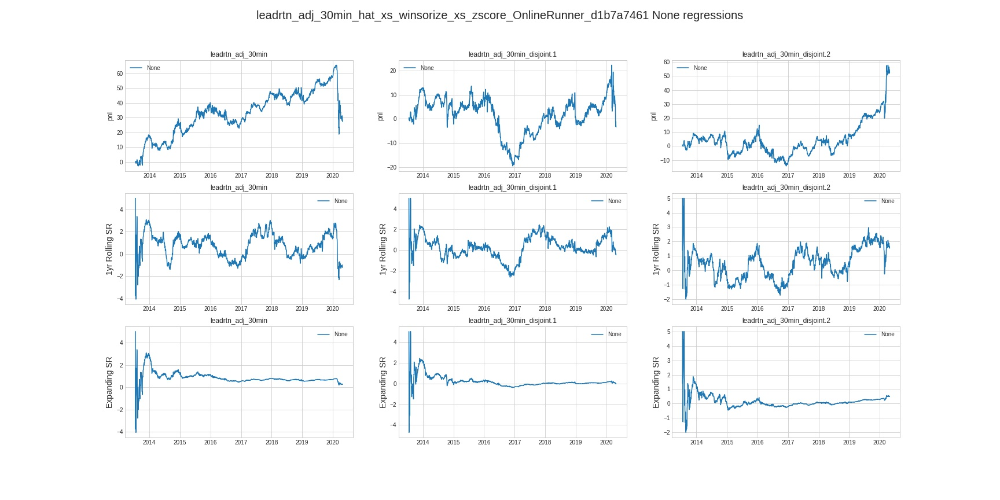

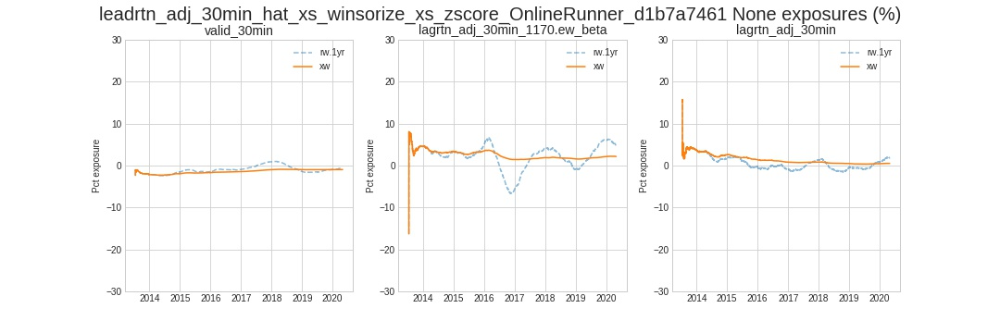

,0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e,fcst_0
leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d1b7a7461,fcst_1


,fcst_0,fcst_1
fcst_0,1.000000,0.469232
fcst_1,0.469232,1.000000


,x,fcst_0,fcst_1
y,tgt,,
fcst_0,leadrtn_adj_30min,-0.298334,-0.371698
fcst_1,leadrtn_adj_30min,0.458141,0.253979


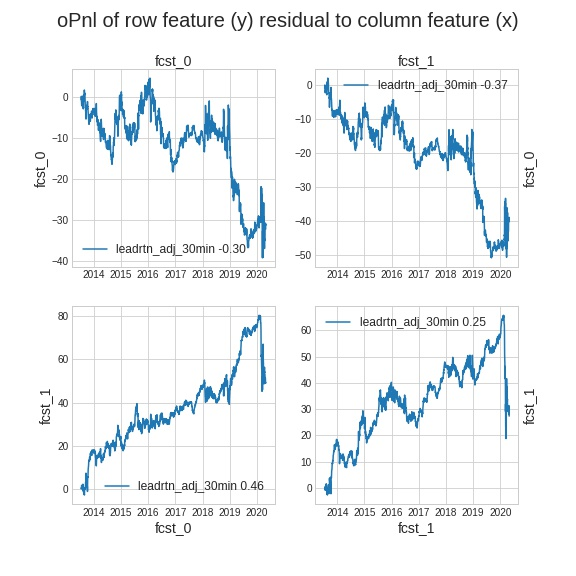

In [100]:
# with wsum=1 logic
##############
%inline
from research.etf_technical import online_runner as reor; reload( reor )

BASELINE_NAME = None
BASELINE_NOTES = '''basic pipeline with weight as a weight - not valid_30min. Built on top OnlineRunner_3eba87e24'''
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# load up a previous baseline as reference and rename its output features
data = mx.Baseline.load( 'OnlineRunner_3eba87e24' )
baselined_forecasts = [
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_e7d983f5e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_d5cf610a7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_73844bf6b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_ac791de12',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_17e75d09f',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_6c9fbc725',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_0a8924518',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f5b754d37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_cdc0aaa37',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_eed1a978d',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_854f955c7',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_dacf3bfd0',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_9fcf514b3',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_01ede913b',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_90531f28c',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_1e827c7b1',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_737670420',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_f2964a6d1',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_b2fc57cfd',
    'leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_3eba87e24',
]

pipeline_hps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', 'weight' ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        []
        +['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='weight',
    # related to pca
    pca=None, 
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=False, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # online Runner hyperparameters
    online = mx.HPSet(
        # stuff related to online learning
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # variance penalty
        halflife_kappa=20, # halflife for vraiance
        tv=None,  # {1:1, 2:1, 13:1e-1},
        ortho=1,
        ortho_hl=13,
        # feautres to orthogonal out
        ortho_features=(
            []                
            + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day', 'weight']  # tilt, mean revrsion  and size
            + hps.feature_set.betas # market
        ),
        algo='mbprox',
        batch_size=5000,    
        # stuff related to sid weighting
        use_omega=None,
        omega_lr=1,
        omega_ridge=1e-2,
        omega_shift=None,    
        # the transformer
        pre_transformer=mx.HPSet(
            pre_normalize=True, pre_clip=3, quadratic=True, post_normalize=True, post_clip=3, 
            ema_halflifes=[13 * 5, 13 * 20, 13 * 40], 
        ),
        # post winsroize the output
        post_transformer=mx.HPSet( winsorize=0.05, ),
        # -- stuff for running regressions ---
        regression_exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
        ),
        regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    )
)
from research.etf_technical import online_runner as reor; reload( reor )
    
# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline_hps == pipeline_hps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if neededb
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = reor.online_pipeline( data=data, hps=pipeline_hps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.hash(), h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        baseline = mx.Baseline.make( runner, hps=pipeline_hps, notebook=Config.code,  notes=BASELINE_NOTES, name=BASELINE_NAME  )
        disp( 'Baselined ', runner.hash(), h=4, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta.get('profiler', []):
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator_forecasts = ['leadrtn_adj_30min_hat_xs_winsorize_xs_zscore_OnlineRunner_7096cf84e',                        
                        baseline.output_features[-1]] 
if comparator_forecasts:
    rename_map = OrderedDict( [(fcst, f'fcst_{i}') for i, fcst in enumerate( comparator_forecasts ) ] ) 
    renamed_data = mx.RenameFeatures( new_features=list( rename_map.values() )  )
    renamed_data.set( data=baseline, features=list(rename_map.keys()), memoize=False )
    renamed_data.run()
    comparator = mx.ForecastComparator( targets=pipeline_hps.targets, weight=pipeline_hps.weight, winlen=None )
    comparator.set( data=renamed_data, features=renamed_data.output_features, memoize=baseline.memoize )
    comparator.run()        
    results = comparator.output_meta        
    disp( f'Comparison for ', pd.DataFrame( rename_map.values(), rename_map.keys() ), h=1 )
    disp( 'Static Forecast correlations', results['fcst_corrs'], h=2 )
    disp( 'Static Forecast auto-correlations', results['static_autocorrs'], h=2 )
    disp( 'Static Orthog SRs', results['static_osrs'], h=2 )
    disp( 'Static Orthog Pnl', results['static_opnl'], h=2 )
    if 'roll_osrs' in results:
        disp( 'Rolling Forecast auto-correlations', result['roll_autocorrs'], h=2 )
        disp( 'Rolling Orthog SRs', results['roll_osrs'], h=2 )
        disp( 'Rolling Orthog Pnl', results['roll_opnl'], h=2 )
        
# compare with other baseliens if needed
if False:
    A = baseline    
    comparator = mx.ForecastComparator( targets=pipeline_hps.online.regression_targets, weight=pipeline_hps.weight )
    B = mx.Baseline.load(  )
    disp( 'Comparing A=', A.name, A.notes, '\n\t with B=', B.name , B.notes, h=3 )
    comparator.compare( A,  B, A_features=A.output_features[-1],  B_features=B.output_features[-1] )

# test sequential booster
----

In [107]:
# seqboost
from madmax.algos.online import furyroad as fr; reload( fr )

da = mx.Baseline.load( 'OnlineRunner_3eba87e24' )


phps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=False, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
    ),        
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    targets=(
        []
        +['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',
    regression_exposures=(
        ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']         
    ),
    regression_targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2'],
    regression_weight='weight',
    # pre and post processing  in furyroad
    pre_transformer=mx.HPSet( pre_winsorize=None, pre_normalize=True, pre_clip=3, transform='quadratic', 
                              post_normalize=True, post_clip=3, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
    # post winsroize the output
    post_transformer=mx.HPSet( winsorize=0.05, zscore=True, clip=3 ),
    # ensembler hps
    ensembler=mx.HPSet(        
        lookahead=2,
        ridge=1e-5,
        hl_1=None,
        hl_2=None,
        lr=500,
        kappa=10,  # variance penalty
        halflife_kappa=20, # halflife for vraiance
        tv={1:1, 2:1, 13:1e-1},
        ortho=1,
        ortho_hl=13,        
        algo='mbprox',
        batch_size=5000,            
        use_omega=None,
        omega_lr=1,
        omega_ridge=1e-2,
        omega_shift=None,
        pre_transformer=mx.HPSet( pre_winsorize=None, pre_normalize=True, pre_clip=3, transform='quadratic', 
                          post_normalize=True, post_clip=3, ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
        # post winsroize the output
        post_transformer=mx.HPSet( winsorize=0.05, zscore=True, clip=3 ),
    ),
    # the boosters
    boosters = [
        mx.HPSet(
            # stuff related to online learning
            lookahead=2,
            ridge=1e-5,
            hl_1=None,
            hl_2=None,
            lr=500,
            kappa=10,  # variance penalty
            halflife_kappa=20, # halflife for vraiance
            tv=None,  # {1:1, 2:1, 13:1e-1},
            ortho=1,
            ortho_hl=13,
            # feautres to orthogonal out
            algo='mbprox',
            batch_size=5000,    
            # stuff related to sid weighting
            use_omega=None,
            omega_lr=1,
            omega_ridge=1e-2,
            omega_shift=None,    
            pre_transformer=None,            
            post_transformer=mx.HPSet( winsorize=0.05, zscore=False ),
        ),
    ],
    
)

from research.etf_technical import online_runner as reor; reload( reor )
mx.online = mx.online.reload()

def build_online_rnn( hps, operator=False, targets=None, weight=None, ortho_features=None, batch_size=None, dtype=tr.float32, device='cuda', verbose=True ):
    '''build an olnine rnn (module or operator) from the given set of hyperparameters'''
    # ubild out the pretransformer
    if hps.pre_transformer:
        pre_tfs = []
        if hps.pre_transformer.pre_winsorize:
            pre_tfs.append( mx.online.OnlineWinsorize( winsorize=hps.pre_transformer.pre_winsorize ) )
        if hps.pre_transformer.pre_normalize:
            pre_tfs.append( mx.online.OnlineNorm( demean=True, normalize=True, clip=hps.pre_transformer.pre_clip, halflife='xw' ) )
        if hps.pre_transformer.transform:
            pre_tfs.append( mx.online.OnlineFeatures( transform=hps.pre_transformer.transform ) )
        if hps.pre_transformer.ema_halflifes:
            pre_tfs.append( mx.online.OnlineEma( halflifes=hps.pre_transformer.ema_halflifes ) )
        if hps.pre_transformer.post_normalize:
            pre_tfs.append( mx.online.OnlineNorm( demean=True, normalize=True, clip=hps.pre_transformer.post_clip, halflife='xw' ) )
        pre_transformer = mx.online.OnlineSequential( *pre_tfs  )
    else:
        pre_transformer = None
    # build out the post transformer
    if hps.post_transformer:
        post_tfs = []
        if hps.post_transformer.winsorize:
            post_tfs.append( mx.online.OnlineWinsorize( winsorize=hps.post_transformer.winsorize ) )
        if hps.post_transformer.zscore:
            post_tfs.append( mx.online.OnlineNorm( demean=True, normalize=True, clip=hps.post_transformer.clip, halflife=13*30 ) )
        post_transformer = mx.online.OnlineSequential( *post_tfs  )
    else:
        post_transformer = None
    if operator:
        rnn = mx.online.OnlineRNN.operator(
            targets=targets, weight=weight, ortho_features=ortho_features, batch_size=batch_size, dtype=dtype, device=device, verbose=verbose, 
            lookahead=hps.lookahead, algo=hps.algo, lr=hps.lr, pre_transformer=pre_transformer, post_transformer=post_transformer, halflife_1=hps.hl_1, halflife_2=hps.hl_2,
            ridge=hps.ridge,   tv=hps.tv, kappa=hps.kappa, halflife_kappa=hps.halflife_kappa, ortho=hps.ortho, halflife_ortho=hps.ortho_hl, 
            use_omega=hps.use_omega, omega_lr=hps.omega_lr, omega_ridge=hps.omega_ridge, omega_shift=hps.omega_shift, 
        )
    else:
        rnn = mx.online.OnlineRNN.operator(            
            lookahead=hps.lookahead, algo=hps.algo, lr=hps.lr, pre_transformer=pre_transformer, post_transformer=post_transformer, halflife_1=hps.hl_1, halflife_2=hps.hl_2,
            ridge=hps.ridge,   tv=hps.tv, kappa=hps.kappa, halflife_kappa=hps.halflife_kappa, ortho=hps.ortho, halflife_ortho=hps.ortho_hl, 
            use_omega=hps.use_omega, omega_lr=hps.omega_lr, omega_ridge=hps.omega_ridge, omega_shift=hps.omega_shift, 
        )
        rnn.verbose = verbose
    return rnn
        

rnn = build_online_rnn( hps=phps.ensembler )


/home/fj/cloud/code/madmax/experiment/hpset.py:17: UserWarning: converting dict tv={1: 1, 2: 1, 13: 0.1}  to OrderedDict - use HPSet instead 
  warnings.warn( f'converting dict {k}={v}  to OrderedDict - use HPSet instead ' )
/home/fj/cloud/code/madmax/experiment/hpset.py:17: UserWarning: converting dict tv=OrderedDict([(1, 1), (2, 1), (13, 0.1)])  to OrderedDict - use HPSet instead 
  warnings.warn( f'converting dict {k}={v}  to OrderedDict - use HPSet instead ' )


NameError: name 'post_transformer' is not defined

> <ipython-input-107-b0107275932b>(145)build_online_rnn()
    143     else:
    144         rnn = mx.online.OnlineRNN.operator(            
--> 145             lookahead=hps.lookahead, algo=hps.algo, lr=hps.lr, pre_transformer=pre_transformer, post_transformer=post_transformer, halflife_1=hps.hl_1, halflife_2=hps.hl_2,
    146             ridge=hps.ridge,   tv=hps.tv, kappa=hps.kappa, halflife_kappa=hps.halflife_kappa, ortho=hps.ortho, halflife_ortho=hps.ortho_hl,
    147             use_omega=hps.use_omega, omega_lr=hps.omega_lr, omega_ridge=hps.omega_ridge, omega_shift=hps.omega_shift,

ipdb> q


In [104]:
def foo( *args ):
    print( args, make_iterable(args ) )
    
    
foo( 1 )

(1,) [1]


# test linear updater vs onlineRnn-v1 vs online-rnn v2

In [ ]:
# test linear updater vs onlineRnn-v1 vs online-rnn v2

%inline
da = disjoint_returns()

phps = mx.HPSet(
    # stuff related to pre and post processing
    start='20080101',
    end=hps.end,  #
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        + hps.feature_set.technical
        + hps.feature_set.afacs            
    ) ),
    targets=(
        ['leadrtn_adj_30min'] 
        #+['leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2']
    ),
    weight='valid_30min',
    lookahead=2,
    ridge=1e-5,
    hl_1=10,
    hl_2=10,
    lr=1e-5,
    kappa=1,  # util penalty
    tv=None,  # {1:1, 2:1, 13:1e-1},
    ortho=1,
    ortho_hl=13,
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market        
    ),
    algo='mbprox',
    batch_size=5000,    
    # stuff related to sid weighting
    use_omega='Q',
    omega_lr=1,
    omega_ridge=0.1,
    omega_shift=0.1,    
)

disp( mx.tensorboard.start( clear=True ) )    
disp( mx.tensorboard.start_server( ) )
device='cpu'

#from madmax.algos.online import rnn_2 as mxrnn2, rnn as mxrnn, learner as mxl; reload( mxrnn2); reload(mxrnn)

if True:
    rnn1 =  mxrnn.OnlineRNN.operator( 
        targets=phps.targets, weight='valid_30min', ortho_features=phps.ortho_features, batch_size=phps.batch_size,
        dtype=dtype, device=device, verbose=False, lookahead=phps.lookahead, ridge=phps.ridge,
        kappa=phps.kappa, algo=phps.algo, halflife_1=phps.hl_1, halflife_2=phps.hl_2, lr=phps.lr, tv=phps.tv,
        ortho=phps.ortho, use_omega=phps.use_omega, omega_lr=phps.omega_lr, omega_ridge=phps.omega_ridge,
        omega_shift=phps.omega_shift, halflife_ortho=phps.ortho_hl, transformer=None, return_params=False,
    )
    rnn1.data = da.loc['20180101':]
    rnn1.features = phps.features
    with timer('runn-1'):
        da1 = rnn1()
    disp( rnn1.output_meta['profiles'] )
        
if True:
    rnn2 =  mxrnn2.OnlineRNN.operator( 
        targets=phps.targets, weight='valid_30min', ortho_features=phps.ortho_features, batch_size=phps.batch_size,
        dtype=dtype, device=device, verbose=False, lookahead=phps.lookahead, ridge=phps.ridge,
        kappa=phps.kappa, algo=phps.algo, halflife_1=phps.hl_1, halflife_2=phps.hl_2, lr=phps.lr, tv=phps.tv,
        ortho=phps.ortho, use_omega=phps.use_omega, omega_lr=phps.omega_lr, omega_ridge=phps.omega_ridge,
        omega_shift=phps.omega_shift, halflife_ortho=phps.ortho_hl, transformer=None, return_params=False,
    )
    rnn2.data = da.loc['20180101':]
    rnn2.features = phps.features
    with timer('runn-2'):
        da2 = rnn2()
    disp( rnn2.output_meta['profiles'] )
        
if True:
    lnr = mxl.OnlineLearner(
        updater=mxl.LinearUpdater( ridge=phps.ridge, loss='psr', algo=phps.algo, lr=phps.lr, hl_1=phps.hl_1, hl_2=phps.hl_2, oridge=phps.ortho ),
        lookahead=phps.lookahead, response=phps.targets, weight=phps.weight,     
    ).set( verbose=True )
    lnr.data = da.loc['20180101':].fillna(0)
    lnr.features = phps.features
    with timer('lnr'):
        da3 = lnr()
        
fig = figure( figsize=(15, 15 ) )
ax = subplot( 2,2, 1)
x = da1.loc[:,:,'leadrtn_adj_30min_hat'].to_series()
y = da2.loc[:,:,'leadrtn_adj_30min_hat'].to_series()
ax.plot( x,y, '.', alpha=0.5, )
ax.set_title( f'forecasts {x.corr(y)*100:0.2f}%' )
ax = subplot( 2,2, 2)
y = da3.loc[:,:,'leadrtn_adj_30min_hat'].to_series()
ax.plot( x, y, '.', alpha=0.5, )
ax.set_title( f'learner forecasts {x.corr(y)*100:0.2f}%' )

# ax = subplot( 2,2, 3)
# x = pd.Series( rnn1.output_meta['beta'].values.reshape(-1) )
# y = pd.Series( rnn2.output_meta['beta'].values.reshape(-1) )
# ax.plot( x,y,  '.', alpha=0.5, )
# ax.set_title( f'betas {x.corr(y)*100:0.2f}%' )
# ax = subplot( 2,2, 4)
# y = pd.Series( lnr.params_da.values.reshape(-1) )
# ax.plot( x, y , '.', alpha=0.5 ) 
# ax.set_title( f'learner betas {x.corr(y)*100:0.2f}%' )


# test online-pca-v1 vs online-pca-v2

pca_factor_0 -0.9995623162625306
pca_factor_1 0.9999833147391982
pca_factor_2 0.99999316514073
pca_factor_3 0.9999999999936863
pca_factor_4 0.999999999992218
pca_eigval_0 0.9999999999679607
pca_eigval_1 0.9999999999659187
pca_eigval_2 0.9999999999966499
pca_eigval_3 0.99999999986678
pca_eigval_4 0.9999999947287465


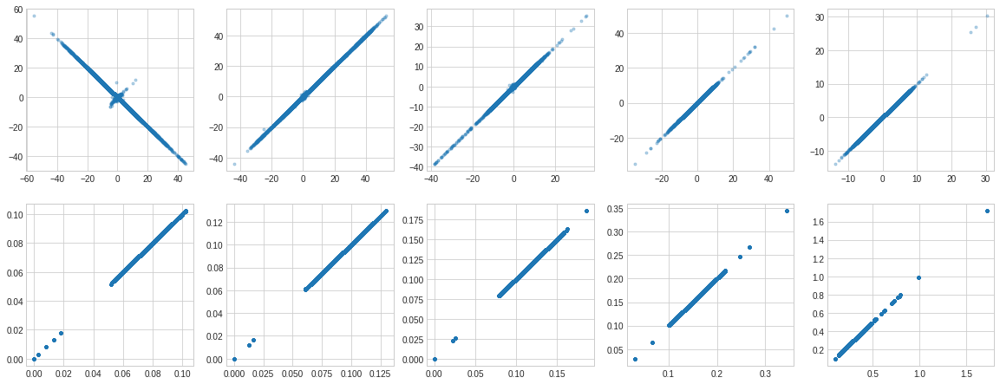

In [56]:
# pca1 va pca2
%inline
disp( mx.tensorboard.start( clear=True ) )    
disp( mx.tensorboard.start_server( ) )
device='cuda'
dtype=tr.float64

da = disjoint_returns().loc['20180101':]


phps = mx.HPSet(
    targets=['lagrtn_adj_30min', 'lagrtn_adj_1day'],
    weight=['weight'],
    halflife=30 * 13,
    rank=5,
    kappa=1e-1,
    ortho=1e-1,
    tv=None,
    ortho_halflife=None,    
    ortho_features=['valid_30min'] + hps.feature_set.betas, # take out tilt and market
    ridge=1e-6,
    batch_size=1000,
    factors_as_features=True, # use the pca factors as features
    factors_as_ortho=True, # use the factors as orthogonal features
    eigens_as_features=False, # the eigvenvalues as features
)


from madmax.algos.online import pca_v2 as mxpca2, pca as mxpca; reload( mxpca2); reload(mxpca)

with timer( 'running v1'):
    pca1 = mxpca.OnlinePCA.operator( weight=phps.weight, ortho_features=phps.ortho_features, batch_size=phps.batch_size,
                                    halflife=phps.halflife, rank=phps.rank, kappa=phps.kappa, ortho=phps.ortho, tv=phps.tv,
                                    ortho_halflife=phps.ortho_halflife, ridge=phps.ridge, verbose=True, metadata=True, )
    da1 = pca1( data=da, features=phps.targets )

    
with timer( 'running v2'):
    pca2 = mxpca2.OnlinePCA.operator( weight=phps.weight, ortho_features=phps.ortho_features, batch_size=phps.batch_size,
                                    halflife=phps.halflife, rank=phps.rank, kappa=phps.kappa, ortho=phps.ortho, tv=phps.tv,
                                    ortho_halflife=phps.ortho_halflife, ridge=phps.ridge, verbose=True, metadata=True, )
    da2 = pca2( data=da, features=phps.targets )

fig = figure( figsize=(20, 20 ) )
for i, ft in enumerate( pca1.output_features ):
    subplot( 5, 5, i+1 )
    x = da1.loc[:,:,ft].to_series()
    y = da2.loc[:,:,ft].to_series()
    plot( x,y, '.', alpha=0.3 )
    print( ft, x.corr(y))    